In [1]:
%matplotlib inline

In [2]:
import numpy as np
import pandas as pd
from nilearn.image import resample_to_img
import nibabel as nib

from nilearn.plotting import plot_roi, plot_anat
from nilearn.plotting import view_img

from matplotlib import pyplot as plt

# 1. Applying non-linear transformation to Nettekoven cerebellar atlas

## Step 1.0. Download atlases, templates and transformations

### Nettekoven 2024 cerebellar atlas in MNI152NLin6AsymC space
downloaded from : \
https://github.com/diedrichsenlab/cerebellar_atlases
- [atl-NettekovenSym128_space-MNI_dseg.nii](https://github.com/DiedrichsenLab/cerebellar_atlases/blob/master/Nettekoven_2024/atl-NettekovenSym128_space-MNI_dseg.nii)

### Tian cortical + subcortical atlas in MNI152NLin2009sAsym**
downloaded from: \
https://github.com/yetianmed/subcortex \
https://github.com/yetianmed/subcortex/tree/master/Group-Parcellation/3T/Cortex-Subcortex/MNIvolumetric
- [Schaefer2018_100Parcels_7Networks_order_Tian_Subcortex_S4_3T_MNI152NLin2009cAsym_1mm.nii.gz](https://github.com/yetianmed/subcortex/blob/master/Group-Parcellation/3T/Cortex-Subcortex/MNIvolumetric/Schaefer2018_100Parcels_7Networks_order_Tian_Subcortex_S4_3T_MNI152NLin2009cAsym_1mm.nii.gz)
- [Schaefer2018_100Parcels_7Networks_order_Tian_Subcortex_S4_3T_MNI152NLin2009cAsym_2mm.nii.gz](https://github.com/yetianmed/subcortex/blob/master/Group-Parcellation/3T/Cortex-Subcortex/MNIvolumetric/Schaefer2018_100Parcels_7Networks_order_Tian_Subcortex_S4_3T_MNI152NLin2009cAsym_2mm.nii.gz)

### Schaefer 2018 (1000 parcels, 7 networks) atlas in MNI152NLin2009sAsym
downloaded from templateflow:
https://www.templateflow.org/browse/
- tpl-MNI152NLin2009cAsym_res-01_atlas-Schaefer2018_desc-1000Parcels7Networks_dseg.nii.gz
- tpl-MNI152NLin2009cAsym_res-02_atlas-Schaefer2018_desc-1000Parcels7Networks_dseg.nii.gz
  
### MNI T1w templates for MNI152NLin6Asym (FSL) and MNI152NLin2009cAsym spaces in res-01 and res-02** 
downloaded from templateflow \
https://www.templateflow.org/browse/
- tpl-MNI152NLin6Asym_res-02_T1w.nii.gz
- tpl-MNI152NLin6Asym_res-02_T1w.nii.gz
- tpl-MNI152NLin2009cAsym_res-01_T1w.nii.gz
- tpl-MNI152NLin2009cAsym_res-02_T1w.nii.gz

### MNI152NLin6Asym to MNI152NLin2009cAsym transformation
downloaded from templateflow  \
https://www.templateflow.org/browse/
- tpl-MNI152NLin2009cAsym_from-MNI152NLin6Asym_mode-image_xfm.h5

## Step 1.1 
### Resample NettekovenAsym128_MNI152NLin6Asym to MNI152NLin6Asym template to apply transform

The atlas needs to be in the same space as the template to apply the transformation. 
Export as tpl-MNI152NLin6Asym_res-01_atlas-NettekovenAsym128_dseg.nii.gz and load onto narval to apply ants transformation


(153, 103, 84) (182, 218, 182) (182, 218, 182)


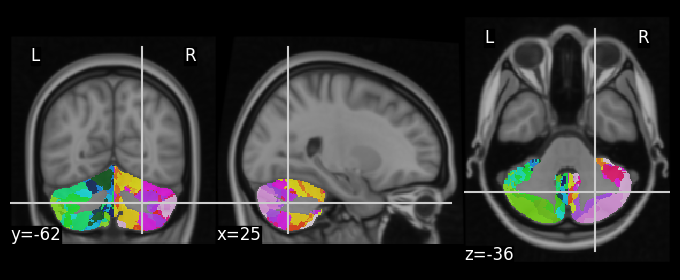

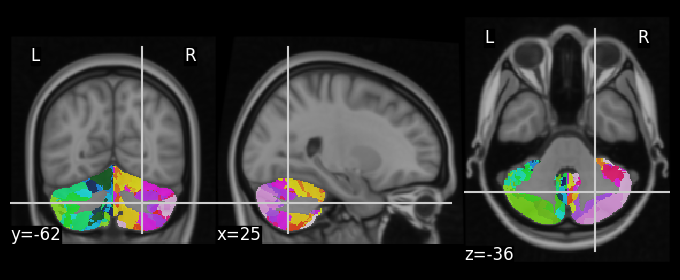

In [6]:
wdir = "../../../../masks/schaeffer_subcortex"

mni_6asym = nib.load(f'{wdir}/tpl-MNI152NLin6Asym_res-01_T1w.nii.gz')

nette128_6asym = nib.load(f'{wdir}/atl-NettekovenAsym128_space-MNI_dseg.nii')
plot_roi(nette128_6asym, mni_6asym)

rs_nette128 = resample_to_img(nette128_6asym, mni_6asym, interpolation="nearest")
plot_roi(rs_nette128, mni_6asym)

print(nette128_6asym.shape, rs_nette128.shape, mni_6asym.shape)
nib.save(rs_nette128, f"{wdir}/tpl-MNI152NLin6Asym_res-01_atlas-NettekovenAsym128_dseg.nii.gz")

# Sanity check: parcellation (parcel numbers, number of voxels per parcel) unchanged by resampling
n128_o = nette128_6asym.get_fdata()
n128_rs = rs_nette128.get_fdata()
for i in np.unique(n128_o):
    if i > 0:
        if np.sum(n128_o ==i) != np.sum(n128_rs ==i):
            print(i, np.sum(n128_o ==i), np.sum(n128_rs ==i))

for i in np.unique(n128_rs):
    if i > 0:
        if np.sum(n128_o ==i) != np.sum(n128_rs ==i):
            print(i, np.sum(n128_o ==i), np.sum(n128_rs ==i))


## Step 1.2
### On narval, use antsApplyTransforms to transform resampled Nettekoven 128 atlas 

Upload to narval:
- {wdir}/tpl-MNI152NLin6Asym_res-01_atlas-NettekovenAsym128_dseg.nii.gz  # resampled parcellation to transform
- {wdir}/transforms/tpl-MNI152NLin2009cAsym_from-MNI152NLin6Asym_mode-image_xfm.h5  # templateflow transformation
- {wdir}/templates/tpl-MNI152NLin2009cAsym_res-01_T1w.nii.gz  # reference template in anat space

Use templateflow xfms (.h5) transformation to transform from MNI152NLin6Asym to MNI152NLin2009cAsym space 

Command line from Gemini:

```shell
antsApplyTransforms -d 3 \
  -i **<input_atlas_NIfTI_file>** \
  -r **<reference_MNI2009cAsym_template>** \
  -o **<output_atlas_NIfTI_file>** \
  -n **<interpolation_method>** \    # GenericLabel (recommended), NearestNeighbor
  -t **<xfms_h5_file>**
```
<br/>

On rorqual: ants/2.6.2 (default choice), StdEnv/2023 gcc/12.3
```shell
module load ants/2.6.2
```
<br/>

#### to transform to anat template resolution using the GenericLabel interpolation
```shell
antsApplyTransforms -d 3 \
  -i tpl-MNI152NLin6Asym_res-01_atlas-NettekovenAsym128_dseg.nii.gz \
  -r tpl-MNI152NLin2009cAsym_res-01_T1w.nii.gz \
  -o tpl-MNI152NLin2009cAsym_res-01_atlas-NettekovenAsym128_desc-GL_dseg.nii.gz \
  -n GenericLabel \
  -t tpl-MNI152NLin2009cAsym_from-MNI152NLin6Asym_mode-image_xfm.h5
```
<br/>


## Step 1.3 
### Perform quality checks on atlas transformations

Visualisation of differences between 2009cSym atlas (from Nettekoven) and 2009cAsym (transformed with ANTS)


(193, 229, 193) (193, 229, 193) (193, 229, 193) (193, 229, 193)


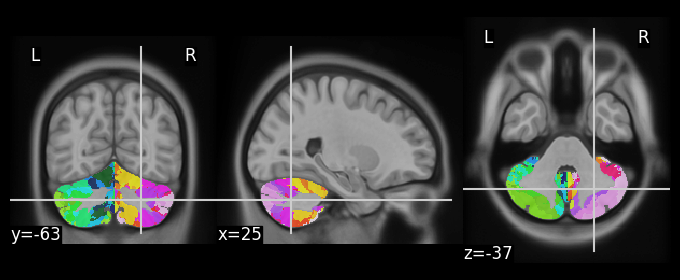

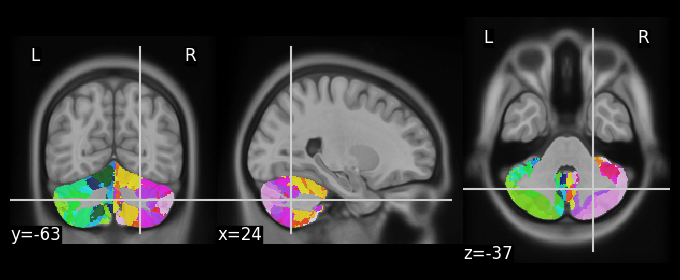

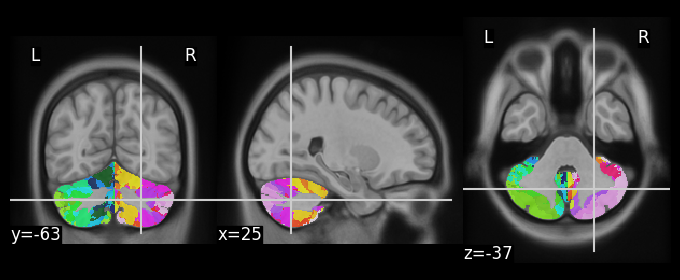

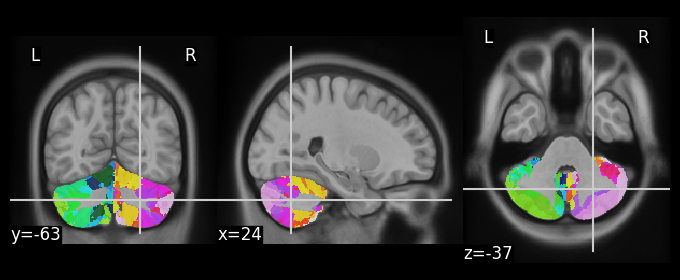

In [9]:
wdir = "../../../../masks/schaeffer_subcortex"

nette128_09csym = nib.load(f'{wdir}/tpl-MNI152NLin2009cSym_res-01_atlas-NettekovenAsym128_dseg.nii.gz')
mni_09csym = nib.load(f'{wdir}/tpl-MNI152NLin2009cSym_res-1_T1w.nii.gz')

nette128_09casym = nib.load(f'{wdir}/tpl-MNI152NLin2009cAsym_res-01_atlas-NettekovenAsym128_desc-GL_dseg.nii.gz')
mni_09casym = nib.load(f'{wdir}/tpl-MNI152NLin2009cAsym_res-01_T1w.nii.gz')

plot_roi(nette128_09csym, mni_09csym)
plot_roi(nette128_09casym, mni_09csym)

plot_roi(nette128_09csym, mni_09casym)
plot_roi(nette128_09casym, mni_09casym)

print(nette128_09csym.shape, nette128_09casym.shape, mni_09csym.shape, mni_09casym.shape)


In [10]:
# Quality check: how much does the transformed 6Asym->2009cAsym parcellation differ 
# (parcel numbers, number of voxels per parcel) from the 2009cSym parcellation

n128_s = nette128_09csym.get_fdata()
n128_a = nette128_09casym.get_fdata()
for i in np.unique(n128_s):
    if i > 0:
        if np.sum(n128_a ==i) == 0:
            print(f"parcel {i} not found in Asym atlas", np.sum(n128_s ==i))
        elif np.sum(n128_s ==i) != np.sum(n128_a ==i):
            print(i, np.sum(n128_s ==i), np.sum(n128_a ==i), abs(np.sum(n128_s ==i) - np.sum(n128_a ==i)))

print()
for i in np.unique(n128_a):
    if i > 0:
        if np.sum(n128_s ==i) == 0:
            print(f"parcel {i} not found in Sym atlas", np.sum(n128_a ==i))
        elif np.sum(n128_s ==i) != np.sum(n128_a ==i):
            print(i, np.sum(n128_s ==i), np.sum(n128_a ==i), abs(np.sum(n128_s ==i) - np.sum(n128_a ==i)))


1.0 128 119 9
2.0 152 153 1
3.0 787 748 39
4.0 3333 3525 192
5.0 564 574 10
6.0 6 2 4
7.0 90 63 27
8.0 6512 6729 217
9.0 1185 1305 120
10.0 130 104 26
11.0 204 212 8
12.0 941 864 77
13.0 1007 1013 6
14.0 33 30 3
15.0 19 13 6
16.0 17 16 1
17.0 795 768 27
20.0 4544 4521 23
21.0 2655 2905 250
22.0 338 353 15
23.0 809 906 97
24.0 67 63 4
25.0 3160 3192 32
26.0 47 60 13
27.0 13 6 7
28.0 2570 2673 103
29.0 1885 2088 203
30.0 329 317 12
31.0 26 23 3
32.0 1175 1083 92
33.0 989 926 63
34.0 186 191 5
35.0 10 3 7
36.0 5333 5413 80
37.0 3640 4177 537
38.0 211 225 14
39.0 472 360 112
40.0 2947 3263 316
41.0 2981 3319 338
42.0 48 52 4
44.0 3248 3510 262
45.0 2303 2403 100
46.0 241 240 1
47.0 3 5 2
48.0 2018 2037 19
49.0 2439 2690 251
50.0 1267 1374 107
51.0 3 2 1
52.0 3329 3176 153
53.0 2202 2053 149
54.0 300 299 1
56.0 1723 1725 2
57.0 1956 2066 110
58.0 501 491 10
60.0 21 23 2
61.0 454 470 16
62.0 548 556 8
64.0 979 1141 162
65.0 563 678 115
66.0 281 294 13
67.0 673 850 177
68.0 4324 4865 541
parc

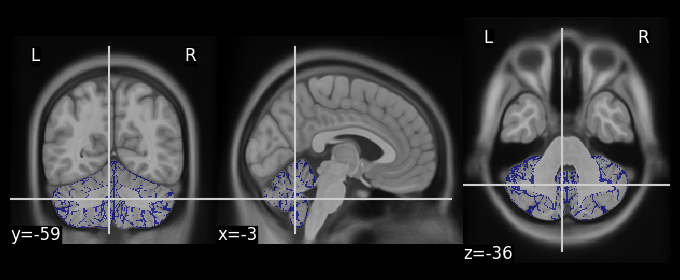

In [11]:
# Visualize difference between 2009c Sym and Asym Nettekoven128 atlases

sym_asym_diff = nib.nifti1.Nifti1Image(
    (n128_s != n128_a).astype(int),
    affine=nette128_09casym.affine,
)
plot_roi(sym_asym_diff, mni_09casym)

# 2. Importing Tian subcortical parcels into Shaeffer1000

Tian S3 atlas has 50 subcortial parcels incorporated into Schaefer400, but we wish to use Schaefer1000. With the following steps, I added the 50 subcortical parcels to Schaefer1000

## 2.1 Sanity checks


(193, 229, 193) (193, 229, 193) (193, 229, 193)


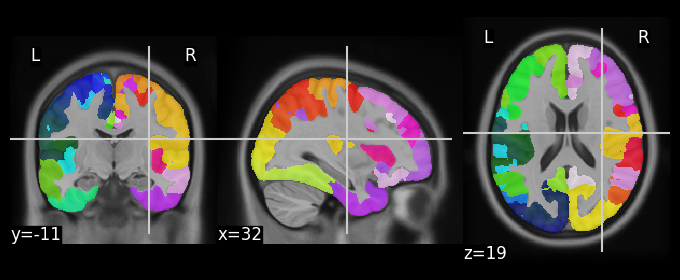

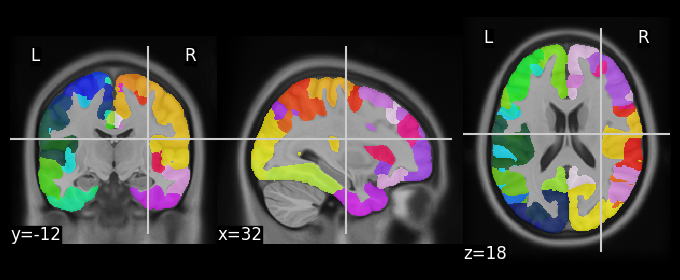

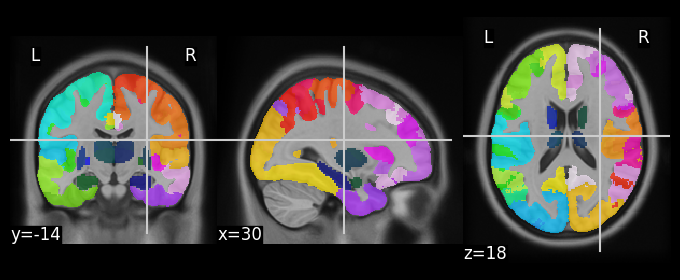

In [17]:
# load 3 atlases : schaefer1000 (7networks), schaefer400 (7 networks) and schaefer400 + tian50 S3

wdir = "../../../../masks/schaeffer_subcortex"
mni_09casym = nib.load(f'{wdir}/tpl-MNI152NLin2009cAsym_res-01_T1w.nii.gz')

scha1000 = nib.load(
    f'{wdir}/tpl-MNI152NLin2009cAsym_res-01_atlas-Schaefer2018_desc-1000Parcels7Networks_dseg.nii.gz'
)
plot_roi(scha1000, mni_09casym)

scha400 = nib.load(
    f'{wdir}/tpl-MNI152NLin2009cAsym_res-01_atlas-Schaefer2018_desc-400Parcels7Networks_dseg.nii.gz'
)
plot_roi(scha400, mni_09casym)

tian400 = nib.load(
    f'{wdir}/Schaefer2018_400Parcels_7Networks_order_Tian_Subcortex_S3_3T_MNI152NLin2009cAsym_1mm.nii.gz'
)
plot_roi(tian400, mni_09casym)

print(scha1000.shape, scha400.shape, tian400.shape)

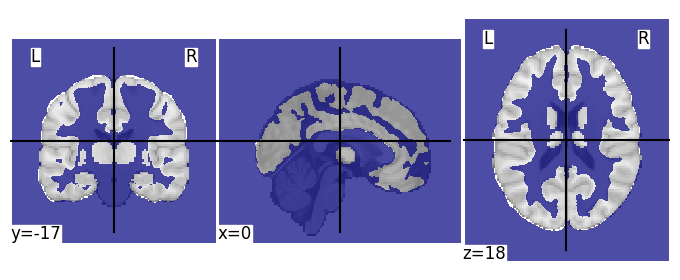

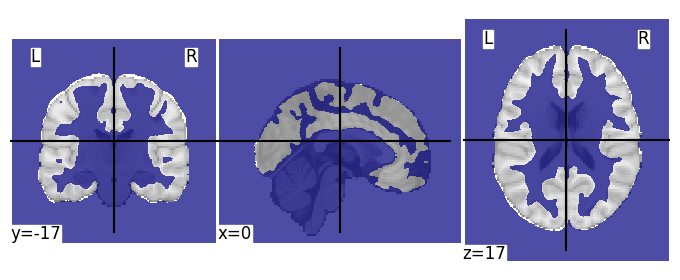

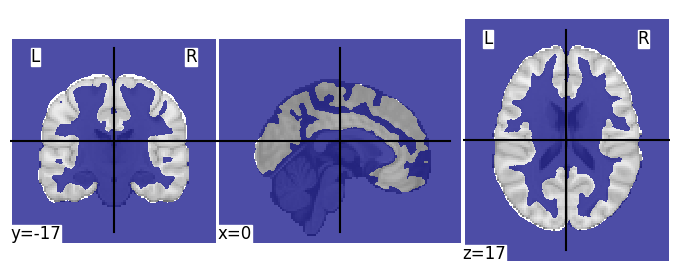

In [18]:
# sanity check: confirm that 0 IS null (not cortex) for all 3 atlases (Tian and schaefer400 and 1000)

plot_roi(nib.nifti1.Nifti1Image(
    (tian400.get_fdata() == 0.0).astype(float),
    affine=tian400.affine,
))
plot_roi(nib.nifti1.Nifti1Image(
    (scha400.get_fdata() == 0.0).astype(float),
    affine=scha400.affine,
))
plot_roi(nib.nifti1.Nifti1Image(
    (scha1000.get_fdata() == 0.0).astype(float),
    affine=scha1000.affine,
))

In [19]:
# Sanity check: complete parcel ID mismatch between shaefer400 and tian 

t400 = tian400.get_fdata()
s400 = scha400.get_fdata()

for v in range(1, 401):
    t_roi = t400 == v
    s4_roi = s400 == v
    print(np.sum(t_roi), np.sum(s4_roi))
    
    ol = np.sum(t_roi * s4_roi)
    tonly = np.sum(np.logical_and(
        t_roi == 1,
        s4_roi == 0,
    ))
    sonly = np.sum(np.logical_and(
        s4_roi == 1,
        t_roi == 0,
    ))    
    print(v, np.sum(t_roi), np.sum(s4_roi))
    print(ol, tonly, sonly)
    print()

1127 2844
1 1127 2844
0 1127 2844

1840 3559
2 1840 3559
0 1840 3559

1584 2503
3 1584 2503
0 1584 2503

848 3415
4 848 3415
0 848 3415

704 3442
5 704 3442
0 704 3442

784 2832
6 784 2832
0 784 2832

2704 1467
7 2704 1467
0 2704 1467

1808 3865
8 1808 3865
0 1808 3865

1376 2693
9 1376 2693
0 1376 2693

1056 2531
10 1056 2531
0 1056 2531

1914 2750
11 1914 2750
0 1914 2750

1759 4485
12 1759 4485
0 1759 4485

1960 962
13 1960 962
0 1960 962

2026 3120
14 2026 3120
0 2026 3120

976 4204
15 976 4204
0 976 4204

1324 1784
16 1324 1784
0 1324 1784

884 3245
17 884 3245
0 884 3245

372 3477
18 372 3477
0 372 3477

1284 4645
19 1284 4645
0 1284 4645

1638 967
20 1638 967
0 1638 967

1608 4110
21 1608 4110
0 1608 4110

1124 1973
22 1124 1973
0 1124 1973

808 4215
23 808 4215
0 808 4215

720 4737
24 720 4737
0 720 4737

876 3925
25 876 3925
0 876 3925

1108 2377
26 1108 2377
0 1108 2377

1794 2836
27 1794 2836
0 1794 2836

1584 1847
28 1584 1847
0 1584 1847

872 2833
29 872 2833
0 872 2833

7

In [20]:
# Number of voxels with id in each template
# Of note, more voxels w id in schaefer1000 than schaefer400 (but most DO overlap)...

t_vox = t400 > 0.0
s4_vox = s400 > 0.0
s10_vox = scha1000.get_fdata() > 0.0

print(np.sum(t_vox), np.sum(s4_vox), np.sum(s10_vox), np.sum(s4_vox*s10_vox))   

1172611 1110464 1102709 1097055


In [21]:
"""
The first 50 tian parcels (indices 1 to 50) are subcortical. 
Indices 51 to 400 are cortical
Index 0 is non-cortical (white matter or CSF or outside the brain)
"""
s400 = scha400.get_fdata()
s1000 = scha1000.get_fdata()
t400 = tian400.get_fdata() 

"""
Check if there is any overlap between tian's SUBCORTICAL structures and schaefer cortical parcels (400 and 1000)
"""
s4_vox = s400 > 0.0
s10_vox = s1000 > 0.0

overlap_s4 = []
overlap_s10 = []
ratio_s4 = []
ratio_s10 = []

print("Tian subcortical parcel ovelap")

for v in range(1, 51):
    t_roi = t400 == v  # tian parcel mask
    t_size = np.sum(t_roi)
    
    ol_4 = np.sum(t_roi * s4_vox)    # overlap w schaefer400 cortex
    ol_10 = np.sum(t_roi * s10_vox)  # overlap w schaefer1000 cortex

    print(v)  # parcel id
    print(t_size, ol_4, ol_10)  # parcel size, overlap w schaefer400 and schaefer1000
    print(np.sum(np.logical_and(t_roi == 1,s4_vox == 0)), np.sum(np.logical_and(t_roi == 1,s10_vox == 0)))  # voxels unique to parcel (vs the two schaefers)
    print()

    overlap_s4.append(ol_4)   
    ratio_s4.append(ol_4/t_size)
    overlap_s10.append(ol_10)    
    ratio_s10.append(ol_10/t_size)

print("Tian cortical parcel ovelap")

for v in range(51, 451):
    t_roi = t400 == v  # tian parcel mask
    t_size = np.sum(t_roi)
    
    ol_4 = np.sum(t_roi * s4_vox)    # overlap w schaefer400 cortex
    ol_10 = np.sum(t_roi * s10_vox)  # overlap w schaefer1000 cortex

    print(v)  # parcel id
    print(t_size, ol_4, ol_10)  # parcel size, overlap w schaefer400 and schaefer1000
    print(np.sum(np.logical_and(t_roi == 1,s4_vox == 0)), np.sum(np.logical_and(t_roi == 1,s10_vox == 0)))  # voxels unique to parcel (vs the two schaefers)
    print()

    overlap_s4.append(ol_4)   
    ratio_s4.append(ol_4/t_size)
    overlap_s10.append(ol_10)    
    ratio_s10.append(ol_10/t_size)


Tian subcortical parcel ovelap
1
1127 80 68
1047 1059

2
1840 144 137
1696 1703

3
1584 95 94
1489 1490

4
848 84 85
764 763

5
704 0 0
704 704

6
784 0 0
784 784

7
2704 0 0
2704 2704

8
1808 0 0
1808 1808

9
1376 0 0
1376 1376

10
1056 0 0
1056 1056

11
1914 0 0
1914 1914

12
1759 0 0
1759 1759

13
1960 0 0
1960 1960

14
2026 0 0
2026 2026

15
976 0 0
976 976

16
1324 0 0
1324 1324

17
884 0 0
884 884

18
372 0 0
372 372

19
1284 55 55
1229 1229

20
1638 2 2
1636 1636

21
1608 10 10
1598 1598

22
1124 0 0
1124 1124

23
808 0 0
808 808

24
720 0 0
720 720

25
876 0 0
876 876

26
1108 37 42
1071 1066

27
1794 44 44
1750 1750

28
1584 31 29
1553 1555

29
872 8 9
864 863

30
704 0 0
704 704

31
866 0 0
866 866

32
2806 0 0
2806 2806

33
1940 0 0
1940 1940

34
1412 0 0
1412 1412

35
1170 0 0
1170 1170

36
1847 0 0
1847 1847

37
1760 0 0
1760 1760

38
1960 0 0
1960 1960

39
1984 0 0
1984 1984

40
1145 0 0
1145 1145

41
1349 0 0
1349 1349

42
994 0 0
994 994

43
398 0 0
398 398

44
1370 130

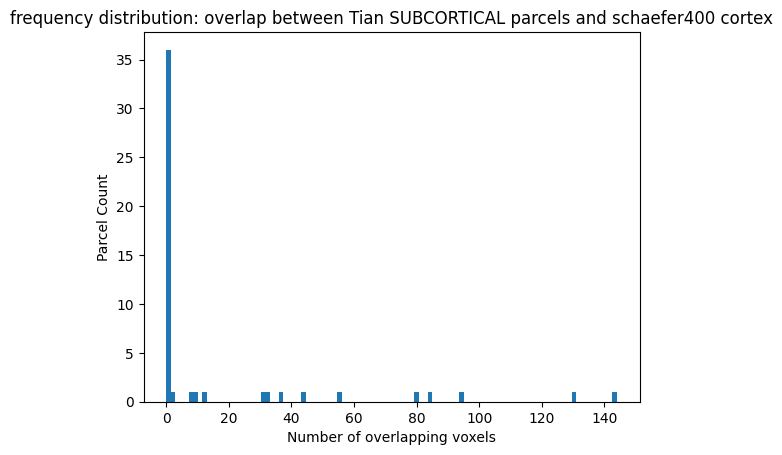

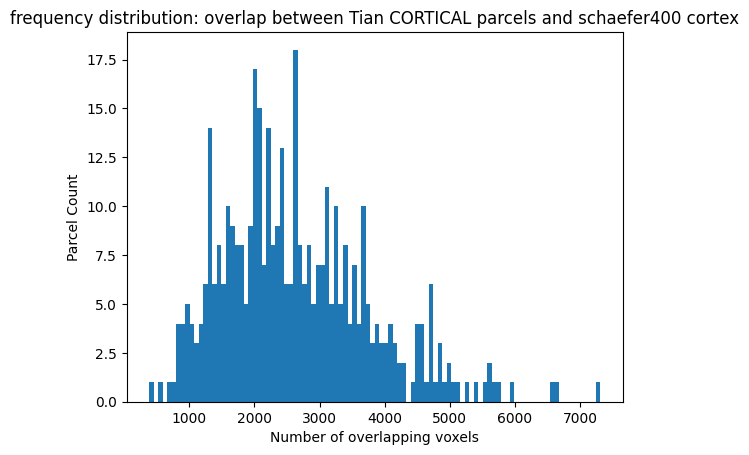

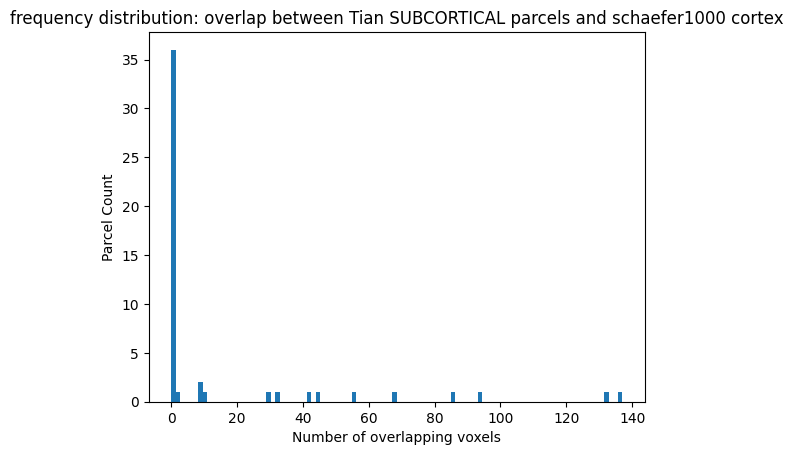

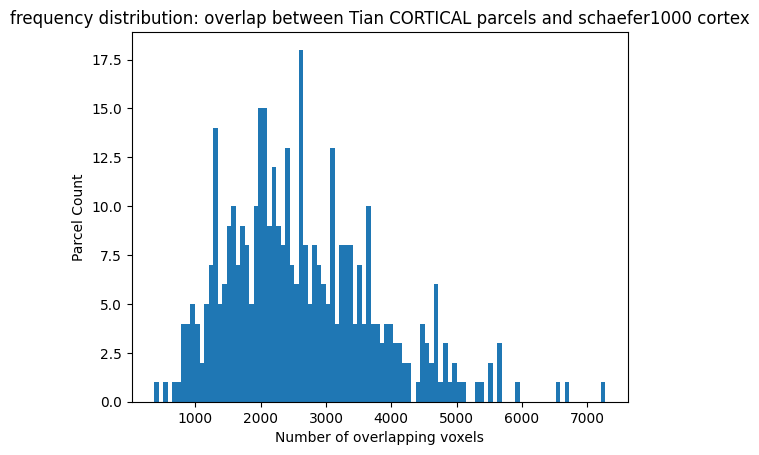

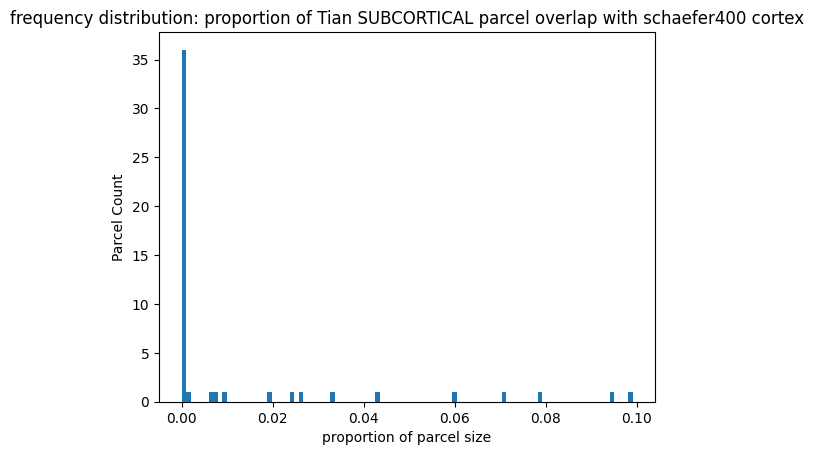

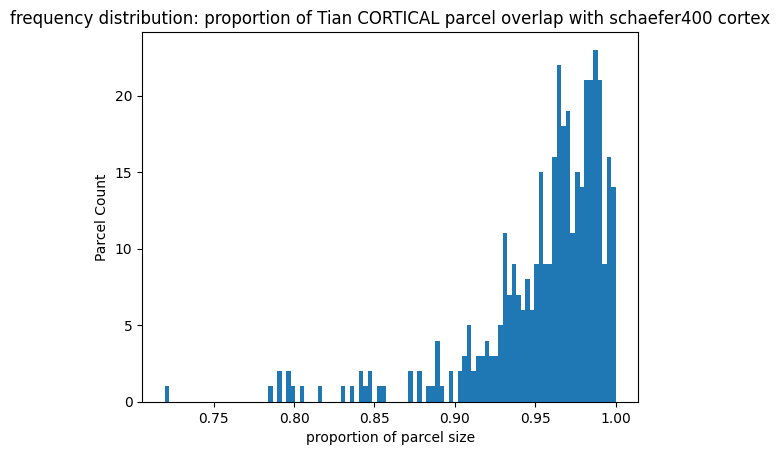

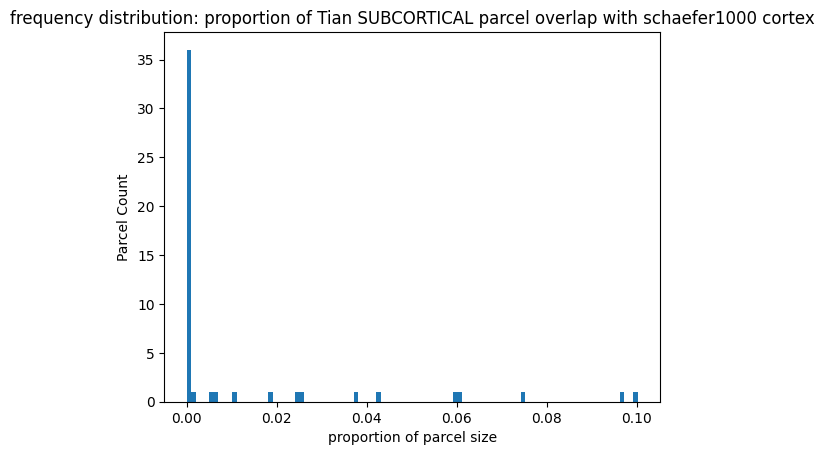

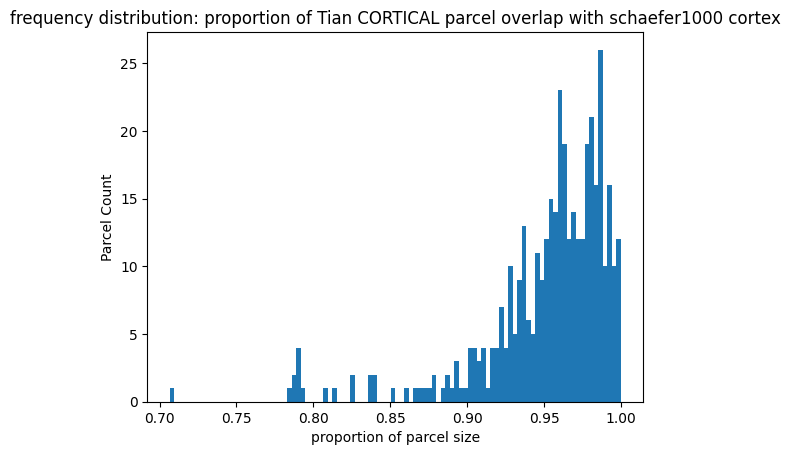

In [22]:
# Most subcortical parcels do NOT overlap with schaefer parcels, and all cortical parcels do

# Tian subcortical parcels that DO overlap have at most a 10% overlap with schaefer parcels (400 or 1000)
# Tian cortical parcels that DO overlap have at least a 60% overlap (but most >80% overlap) with schaefer parcels (400 or 1000)

plt.hist(overlap_s4[:50], bins=100)
plt.title("frequency distribution: overlap between Tian SUBCORTICAL parcels and schaefer400 cortex")
plt.xlabel('Number of overlapping voxels')
plt.ylabel('Parcel Count')
plt.show()

plt.hist(overlap_s4[50:], bins=100)
plt.title("frequency distribution: overlap between Tian CORTICAL parcels and schaefer400 cortex")
plt.xlabel('Number of overlapping voxels')
plt.ylabel('Parcel Count')
plt.show()

plt.hist(overlap_s10[:50], bins=100)
plt.title("frequency distribution: overlap between Tian SUBCORTICAL parcels and schaefer1000 cortex")
plt.xlabel('Number of overlapping voxels')
plt.ylabel('Parcel Count')
plt.show()

plt.hist(overlap_s10[50:], bins=100)
plt.title("frequency distribution: overlap between Tian CORTICAL parcels and schaefer1000 cortex")
plt.xlabel('Number of overlapping voxels')
plt.ylabel('Parcel Count')
plt.show()


plt.hist(ratio_s4[:50], bins=100)
plt.title("frequency distribution: proportion of Tian SUBCORTICAL parcel overlap with schaefer400 cortex")
plt.xlabel('proportion of parcel size')
plt.ylabel('Parcel Count')
plt.show()

plt.hist(ratio_s4[50:], bins=100)
plt.title("frequency distribution: proportion of Tian CORTICAL parcel overlap with schaefer400 cortex")
plt.xlabel('proportion of parcel size')
plt.ylabel('Parcel Count')
plt.show()


plt.hist(ratio_s10[:50], bins=100)
plt.title("frequency distribution: proportion of Tian SUBCORTICAL parcel overlap with schaefer1000 cortex")
plt.xlabel('proportion of parcel size')
plt.ylabel('Parcel Count')
plt.show()

plt.hist(ratio_s10[50:], bins=100)
plt.title("frequency distribution: proportion of Tian CORTICAL parcel overlap with schaefer1000 cortex")
plt.xlabel('proportion of parcel size')
plt.ylabel('Parcel Count')
plt.show()


In [23]:
"""
Check if there is any overlap between Schaefer's cortical parcels and tian's cortical / subcortical parcels
"""
tian_cortex = t400 > 50.0
tian_sub = np.logical_and(
    t400 < 51.0,
    t400 > 0.0,    
)
tian_null = t400 == 0.0


cortical_overlap_s4 = []
cortical_overlap_ratio_s4 = []
subcortical_overlap_s4 = []
subcortical_overlap_ratio_s4 = []


for v in range(1, 401):
    s4_roi = s400 == v
    s4_size = np.sum(s4_roi)

    co_s4 = np.sum(s4_roi*tian_cortex)
    so_s4 = np.sum(s4_roi*tian_sub)
    no_s4 = np.sum(s4_roi*tian_null)
    

    print(v, s4_size)
    print(co_s4, so_s4, no_s4)
    print()
    cortical_overlap_s4.append(co_s4)
    cortical_overlap_ratio_s4.append(co_s4/s4_size)
    subcortical_overlap_s4.append(so_s4)
    subcortical_overlap_ratio_s4.append(so_s4/s4_size)


cortical_overlap_s10 = []
cortical_overlap_ratio_s10 = []
subcortical_overlap_s10 = []
subcortical_overlap_ratio_s10 = []

for v in range(1, 1001):
    s10_roi = s1000 == v
    s10_size = np.sum(s10_roi)

    co_s10 = np.sum(s10_roi*tian_cortex)
    so_s10 = np.sum(s10_roi*tian_sub)
    no_s10 = np.sum(s10_roi*tian_null)
    

    print(v, s10_size)
    print(co_s10, so_s10, no_s10)
    print()
    cortical_overlap_s10.append(co_s10)
    cortical_overlap_ratio_s10.append(co_s10/s10_size)
    subcortical_overlap_s10.append(so_s10)
    subcortical_overlap_ratio_s10.append(so_s10/s10_size)


1 2844
2833 0 11

2 3559
3334 54 171

3 2503
2492 0 11

4 3415
3310 0 105

5 3442
3277 0 165

6 2832
2812 0 20

7 1467
1379 4 84

8 3865
3807 0 58

9 2693
2617 0 76

10 2531
2458 0 73

11 2750
2689 0 61

12 4485
4346 0 139

13 962
917 1 44

14 3120
2977 0 143

15 4204
4110 0 94

16 1784
1696 0 88

17 3245
3189 0 56

18 3477
3421 0 56

19 4645
4562 0 83

20 967
884 0 83

21 4110
3969 0 141

22 1973
1862 0 111

23 4215
4130 0 85

24 4737
4590 0 147

25 3925
3837 0 88

26 2377
2372 0 5

27 2836
2756 0 80

28 1847
1824 0 23

29 2833
2796 0 37

30 2081
2038 0 43

31 1906
1867 0 39

32 3331
3291 0 40

33 4365
4345 0 20

34 1244
1238 0 6

35 2114
1994 0 120

36 1502
1309 0 193

37 2334
2328 0 6

38 1709
1694 0 15

39 2103
1974 0 129

40 1789
1782 0 7

41 1817
1711 0 106

42 1712
1701 0 11

43 2338
2286 0 52

44 1707
1675 0 32

45 1554
1552 0 2

46 1609
1600 0 9

47 2811
2601 0 210

48 1478
1449 0 29

49 2685
2609 0 76

50 1681
1662 0 19

51 1660
1492 0 168

52 3063
2667 0 396

53 1066
1057 0 

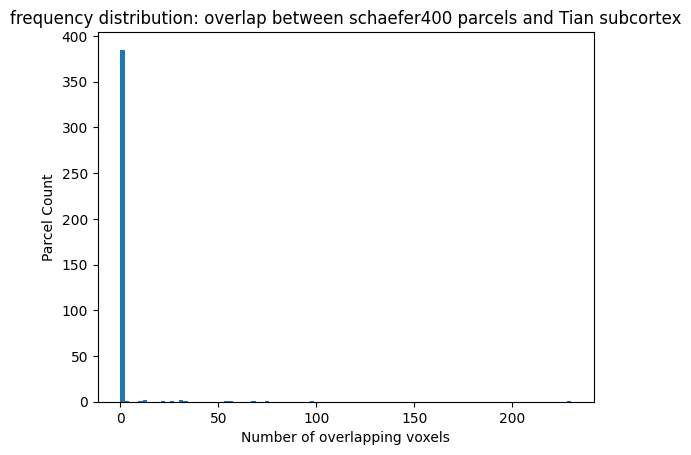

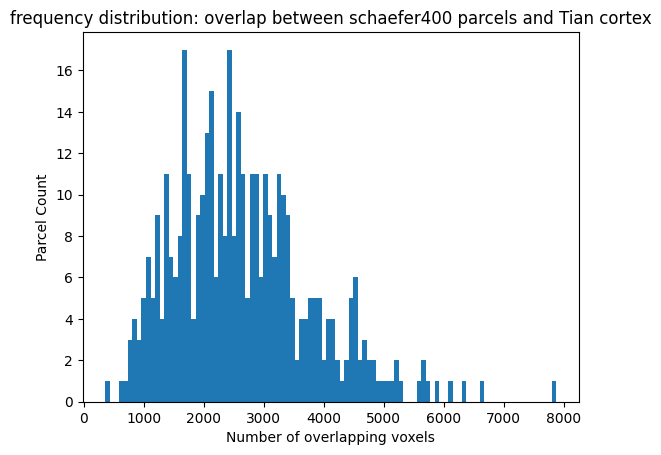

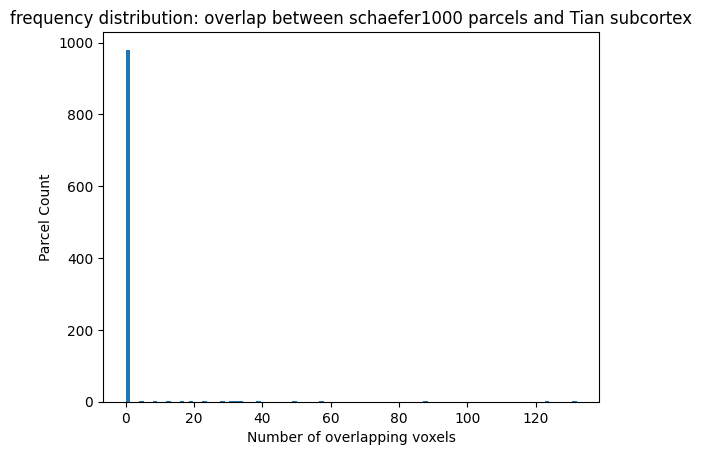

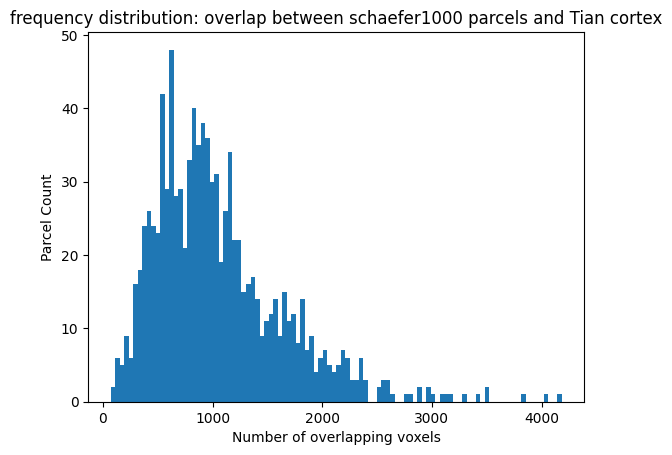

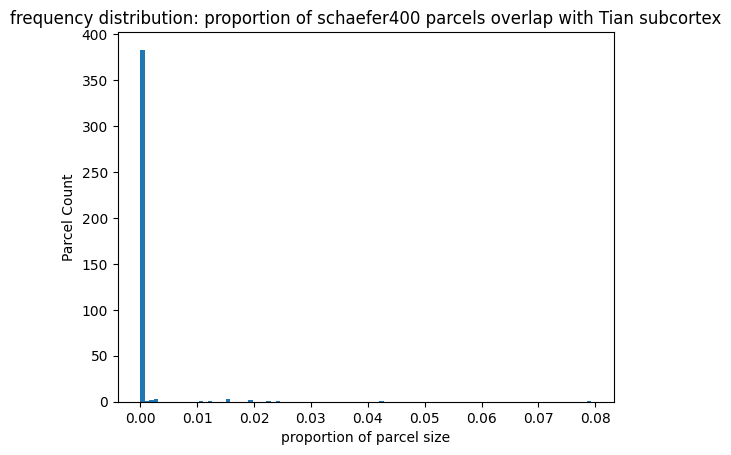

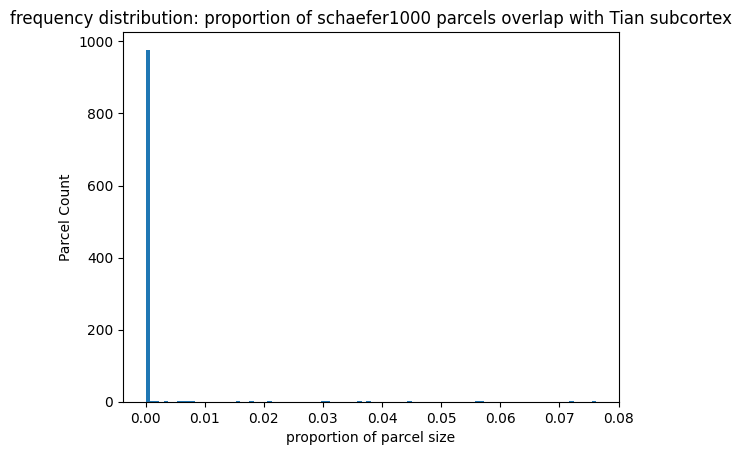

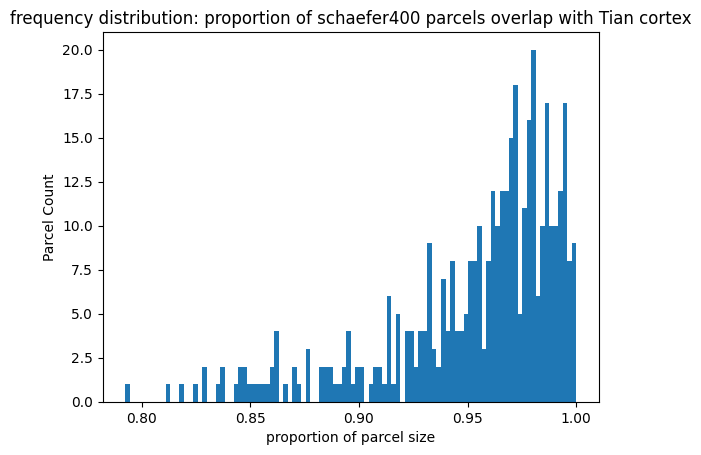

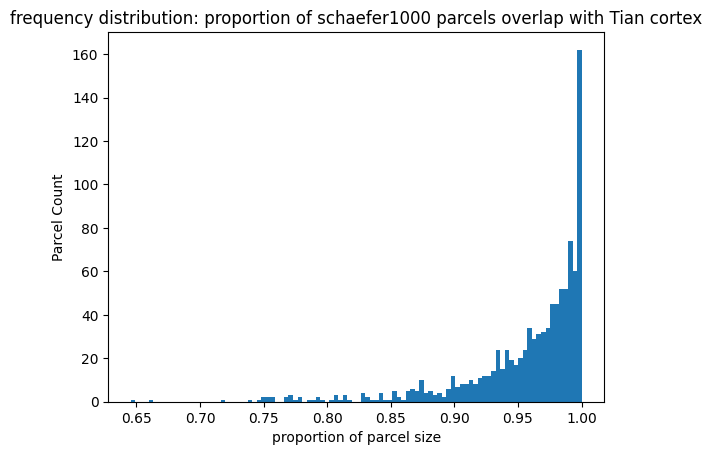

In [24]:
# Most Schaefer cortical parcels DO NOT overlap with subcortical parcels, and those who do only share a few voxels
# Most Schaefer cortical parcels DO overlap with cortical parcels, and those who share most of their voxels

plt.hist(subcortical_overlap_s4, bins=100)
plt.title("frequency distribution: overlap between schaefer400 parcels and Tian subcortex")
plt.xlabel('Number of overlapping voxels')
plt.ylabel('Parcel Count')
plt.show()

plt.hist(cortical_overlap_s4, bins=100)
plt.title("frequency distribution: overlap between schaefer400 parcels and Tian cortex")
plt.xlabel('Number of overlapping voxels')
plt.ylabel('Parcel Count')
plt.show()

plt.hist(subcortical_overlap_s10, bins=100)
plt.title("frequency distribution: overlap between schaefer1000 parcels and Tian subcortex")
plt.xlabel('Number of overlapping voxels')
plt.ylabel('Parcel Count')
plt.show()

plt.hist(cortical_overlap_s10, bins=100)
plt.title("frequency distribution: overlap between schaefer1000 parcels and Tian cortex")
plt.xlabel('Number of overlapping voxels')
plt.ylabel('Parcel Count')
plt.show()



plt.hist(subcortical_overlap_ratio_s4, bins=100)
plt.title("frequency distribution: proportion of schaefer400 parcels overlap with Tian subcortex")
plt.xlabel('proportion of parcel size')
plt.ylabel('Parcel Count')
plt.show()

plt.hist(subcortical_overlap_ratio_s10, bins=100)
plt.title("frequency distribution: proportion of schaefer1000 parcels overlap with Tian subcortex")
plt.xlabel('proportion of parcel size')
plt.ylabel('Parcel Count')
plt.show()

plt.hist(cortical_overlap_ratio_s4, bins=100)
plt.title("frequency distribution: proportion of schaefer400 parcels overlap with Tian cortex")
plt.xlabel('proportion of parcel size')
plt.ylabel('Parcel Count')
plt.show()

plt.hist(cortical_overlap_ratio_s10, bins=100)
plt.title("frequency distribution: proportion of schaefer1000 parcels overlap with Tian cortex")
plt.xlabel('proportion of parcel size')
plt.ylabel('Parcel Count')
plt.show()

## 2.2 Importing Tian subcortical parcels into Schaefer 1000

Note: import only at anatomical resolution (res=1)

Tian parcels 1-50 (subcortical) are added to Schaefer1000

In order to preserve the original Schaefer parcel indexation, 
the Tian parcels become indexed 1001 to 1051 in the new composite Atlas

(193, 229, 193) (193, 229, 193)
451 1001


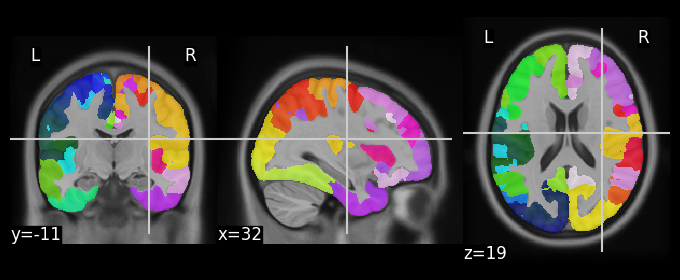

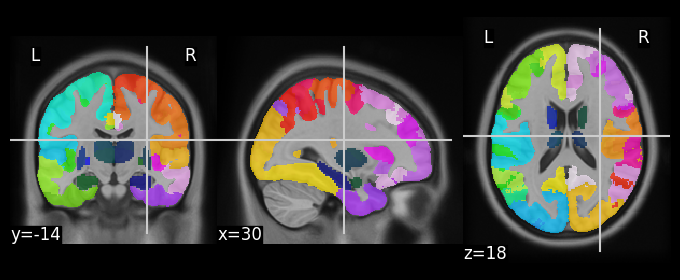

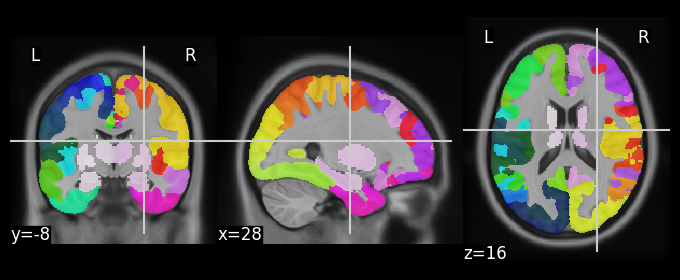

In [25]:
wdir = "../../../../masks/schaeffer_subcortex"

mni_09casym = nib.load(f'{wdir}/tpl-MNI152NLin2009cAsym_res-01_T1w.nii.gz')

scha1000 = nib.load(
    f'{wdir}/tpl-MNI152NLin2009cAsym_res-01_atlas-Schaefer2018_desc-1000Parcels7Networks_dseg.nii.gz'
)
plot_roi(scha1000, mni_09casym)

tian400 = nib.load(
    f'{wdir}/Schaefer2018_400Parcels_7Networks_order_Tian_Subcortex_S3_3T_MNI152NLin2009cAsym_1mm.nii.gz'
)
plot_roi(tian400, mni_09casym)

print(tian400.shape, scha1000.shape)
print(len(np.unique(tian400.get_fdata())), len(np.unique(scha1000.get_fdata())))


t400 = tian400.get_fdata()
s1000 = scha1000.get_fdata()

"""
Attribute voxels to the Tian subcortical parcel if they  :
- belong to that parcel in Tian400
- are not yet assigned to a schaefer1000 cortical parcel (idx = 0)
Reindex the subcortical parcel number to 1000 + Tian index
"""
for v in range(1, 51):
    s1000[np.logical_and(
        s1000 == 0.0,
        t400 == v,
    )] = v + 1000.0

# Create a nifti file from the array of indices
scha1050 = nib.nifti1.Nifti1Image(
    s1000,
    affine=scha1000.affine,
)
plot_roi(scha1050, mni_09casym)

nib.save(scha1050, f"{wdir}/tpl-MNI152NLin2009cAsym_res-01_atlas-Schaefer2018plus_desc-1050Parcels7NetworksTianS3_dseg.nii.gz")


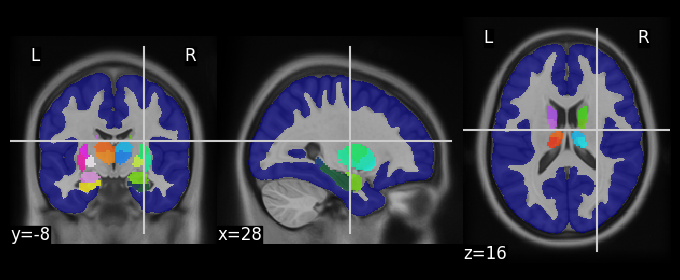

In [26]:
plot_roi(scha1050, mni_09casym, vmin=1000)

## 2.3 Assessing parcel size within each subject's functional mask 

Note: each subject's mask was derived from the intersection between a freesurfer grey matter mask in native space (warped to MNI space with fmriprep transformation), and a combination of the run-wise fnmriprep functional masks from 6 season (fewer for sub-04) of the friends dataset


(241, 286, 241) (193, 229, 193) (193, 229, 193) (97, 115, 97) (97, 115, 97)
(241, 286, 241) (193, 229, 193) (193, 229, 193) (97, 115, 97) (97, 115, 97)
(241, 286, 241) (193, 229, 193) (193, 229, 193) (97, 115, 97) (97, 115, 97)
(241, 286, 241) (193, 229, 193) (193, 229, 193) (97, 115, 97) (97, 115, 97)
(241, 286, 241) (193, 229, 193) (193, 229, 193) (97, 115, 97) (97, 115, 97)
(241, 286, 241) (193, 229, 193) (193, 229, 193) (97, 115, 97) (97, 115, 97)


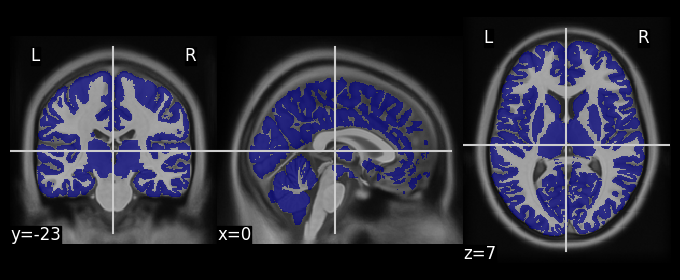

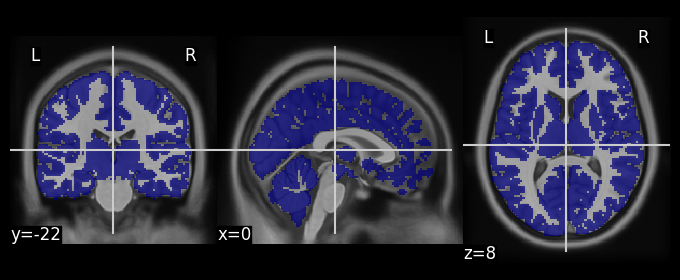

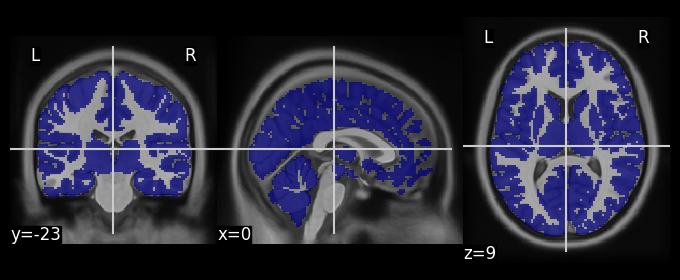

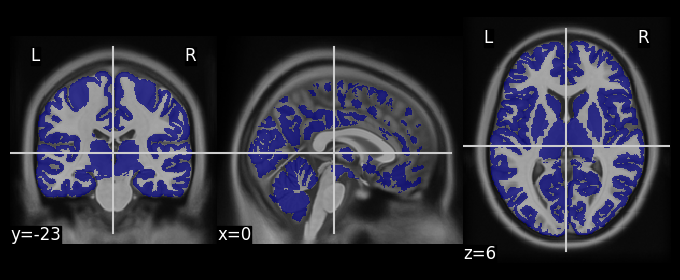

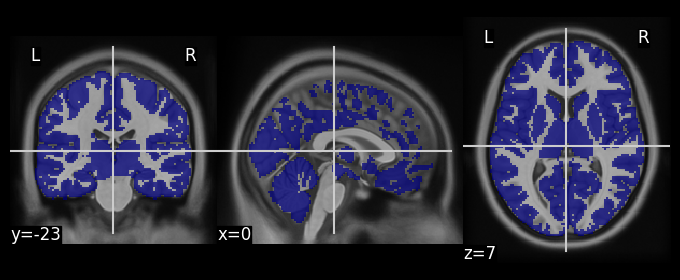

...

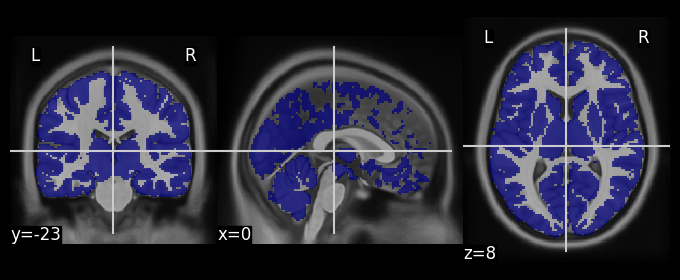

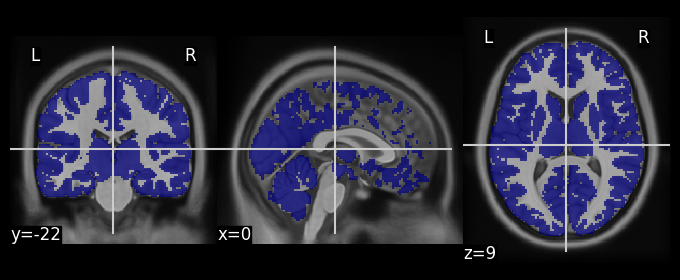

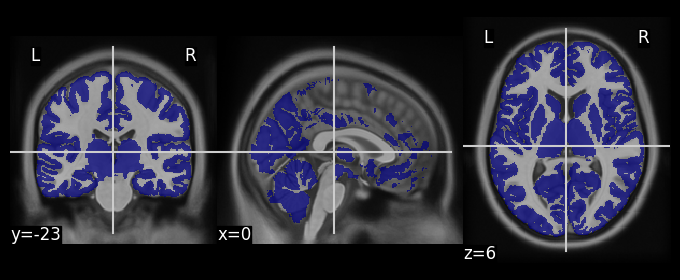

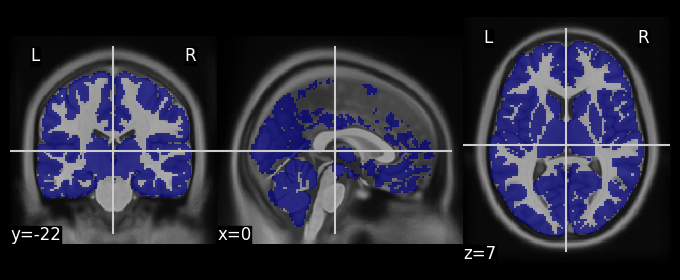

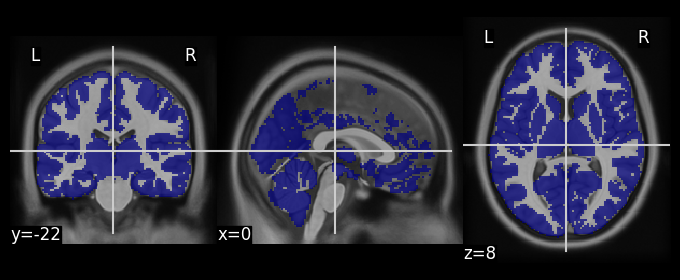

In [32]:
# Visualize subject's mask
wdir = "../../../../masks/schaeffer_subcortex"
mni_09casym = nib.load(f'{wdir}/tpl-MNI152NLin2009cAsym_res-01_T1w.nii.gz')

scha1050 = nib.load(
    f"{wdir}/tpl-MNI152NLin2009cAsym_res-01_atlas-Schaefer2018plus_desc-1050Parcels7NetworksTianS3_dseg.nii.gz"
)

# for all subjects
for s in ["01", "02", "03", "04", "05", "06"]:
    # LESS CONSERVATIVE
    # freesurfer grey-matter mask warped from native to MNI space
    gm_mask_res1 = nib.load(
        f'{wdir}/tpl-MNI152NLin2009cAsym_sub-{s}_res-anat_label-GM_desc-fromFS_dseg.nii.gz'
    )
    plot_roi(gm_mask_res1, mni_09casym)
    
    gm_mask_res2 = nib.load(
        f'{wdir}/tpl-MNI152NLin2009cAsym_sub-{s}_res-func_label-GM_desc-fromFS_dseg.nii.gz'
    )
    plot_roi(gm_mask_res2, mni_09casym)
    
    # THE ONE WE'RE USING
    # functional mask plus freesurfer grey nmatter mask warped from native to MNI space
    gm_friends = nib.load(
        f"{wdir}/sub-{s}_task-friends_space-MNI152NLin2009cAsym_label-boldGMOverlap_mask.nii.gz"
    )
    plot_roi(gm_friends, mni_09casym)
    
    print(gm_mask_res1.shape, scha1050.shape, mni_09casym.shape, gm_mask_res2.shape, gm_friends.shape)
    

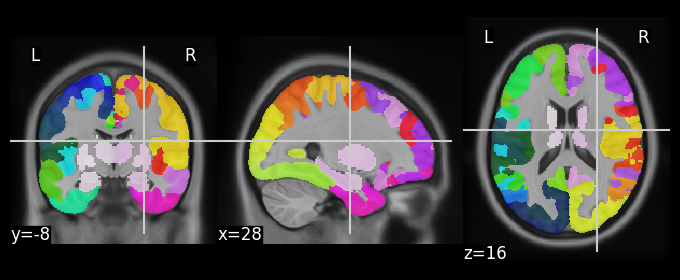

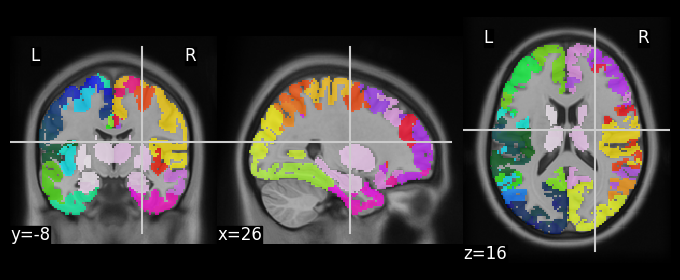

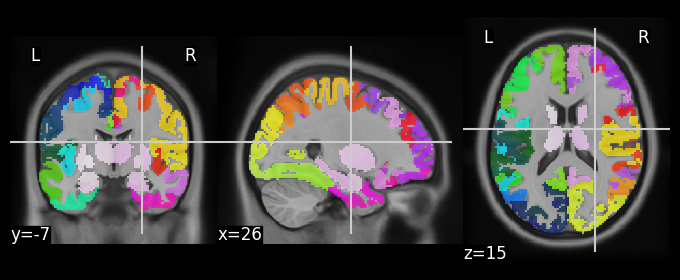

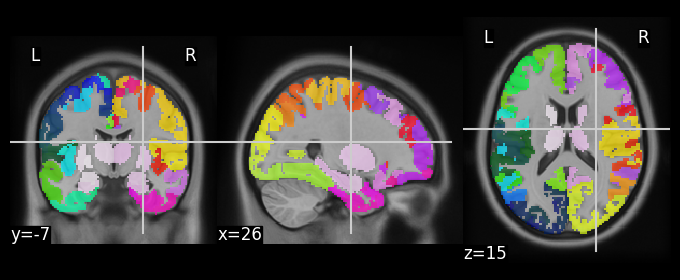

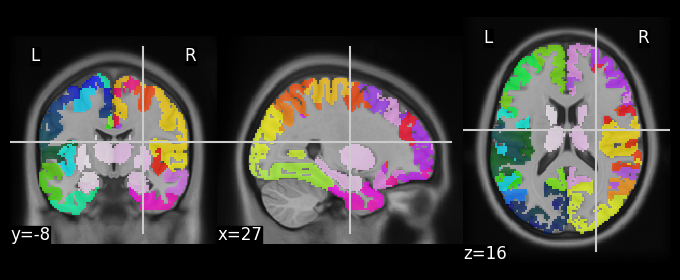

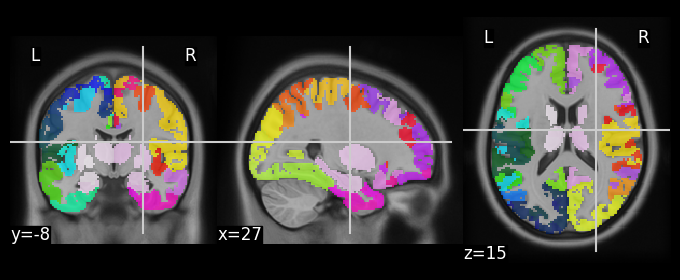

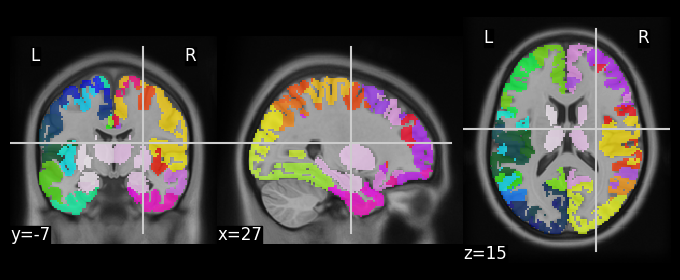

In [35]:
scha1050 = nib.load(
    f"{wdir}/tpl-MNI152NLin2009cAsym_res-01_atlas-Schaefer2018plus_desc-1050Parcels7NetworksTianS3_dseg.nii.gz"
)
plot_roi(scha1050, mni_09casym)

# for all subjects
for s in ["01", "02", "03", "04", "05", "06"]:
    # THE ONE WE'RE USING
    # functional mask plus freesurfer grey nmatter mask warped from native to MNI space
    gm_friends = nib.load(
        f"{wdir}/sub-{s}_task-friends_space-MNI152NLin2009cAsym_label-boldGMOverlap_mask.nii.gz"
    )
    
    masked_scha1050 = nib.nifti1.Nifti1Image(
        gm_friends.get_fdata()*resample_to_img(scha1050, gm_friends, interpolation="nearest").get_fdata(),
        affine=gm_friends.affine,
    )
    plot_roi(masked_scha1050, mni_09casym)

atlas [[11, 903], [13, 245], [14, 466], [16, 865], [18, 471], [20, 476], [21, 622], [23, 985], [23, 653], [24, 155]]


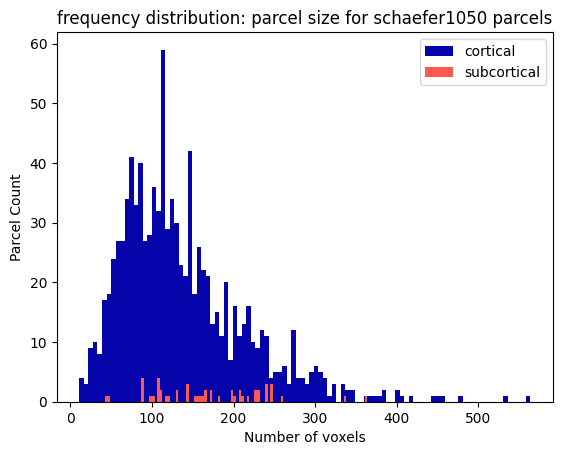

sub-01 [[6.0, 680.0], [7.0, 903.0], [10.0, 822.0], [11.0, 245.0], [11.0, 821.0], [13.0, 466.0], [13.0, 471.0], [15.0, 476.0], [16.0, 482.0], [16.0, 865.0]]


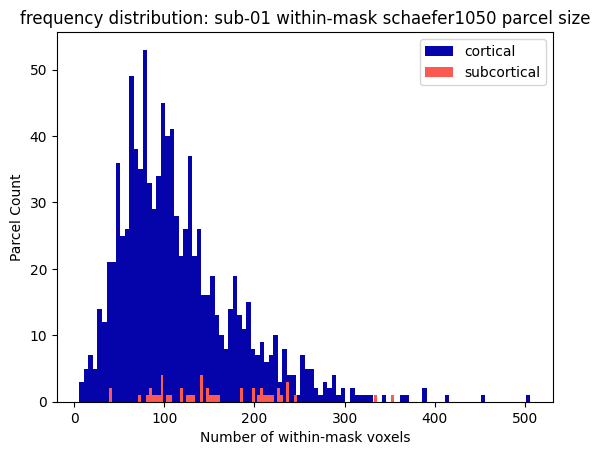

sub-02 [[8.0, 903.0], [10.0, 245.0], [13.0, 680.0], [13.0, 466.0], [15.0, 482.0], [15.0, 476.0], [16.0, 471.0], [16.0, 622.0], [16.0, 865.0], [19.0, 653.0]]


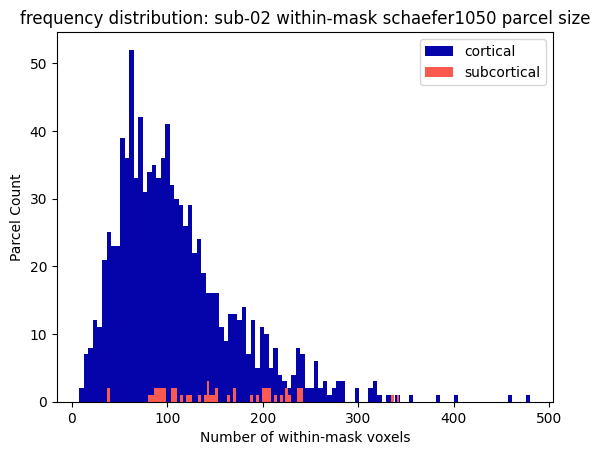

sub-03 [[9.0, 903.0], [12.0, 245.0], [13.0, 680.0], [13.0, 466.0], [16.0, 476.0], [16.0, 471.0], [16.0, 865.0], [17.0, 622.0], [20.0, 424.0], [21.0, 985.0]]


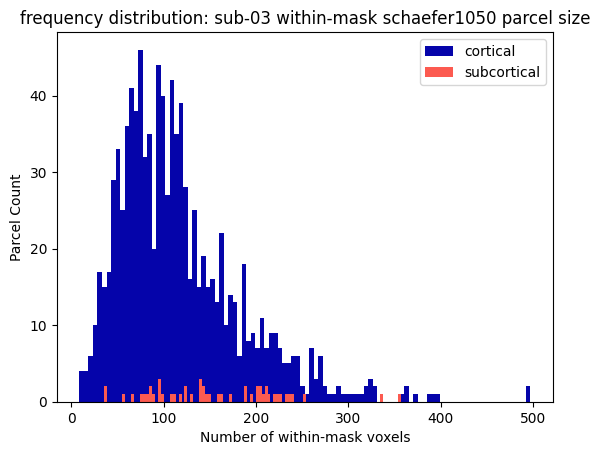

sub-04 [[8.0, 903.0], [11.0, 245.0], [12.0, 466.0], [13.0, 471.0], [14.0, 680.0], [15.0, 865.0], [16.0, 476.0], [17.0, 482.0], [19.0, 765.0], [20.0, 985.0]]


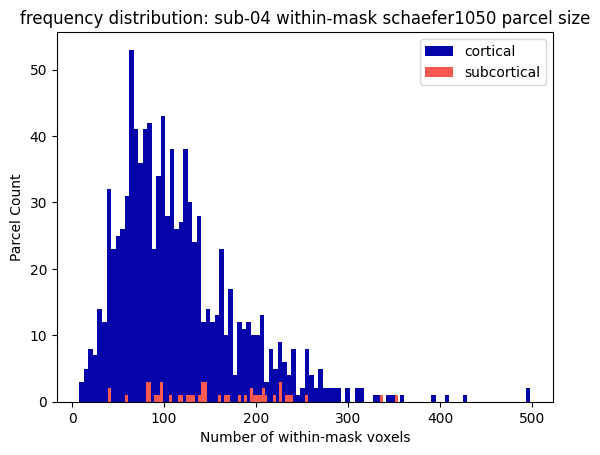

sub-05 [[6.0, 903.0], [13.0, 245.0], [14.0, 466.0], [15.0, 476.0], [15.0, 471.0], [16.0, 865.0], [17.0, 482.0], [17.0, 680.0], [17.0, 424.0], [18.0, 50.0]]


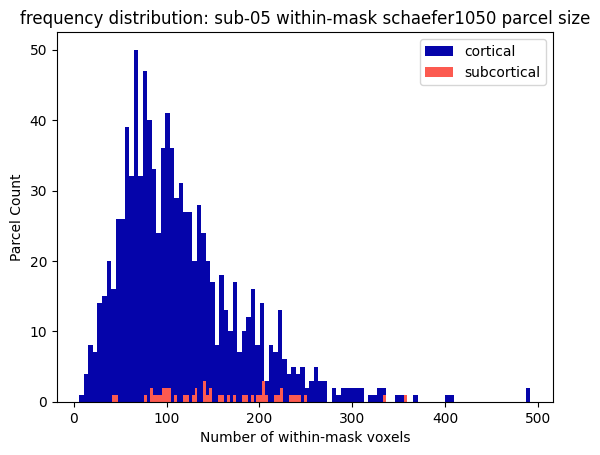

sub-06 [[1.0, 366.0], [3.0, 471.0], [3.0, 476.0], [4.0, 985.0], [7.0, 680.0], [8.0, 903.0], [10.0, 466.0], [11.0, 371.0], [12.0, 245.0], [13.0, 653.0]]


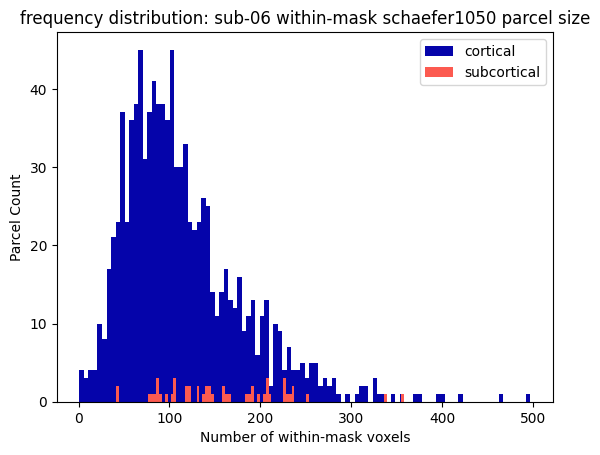

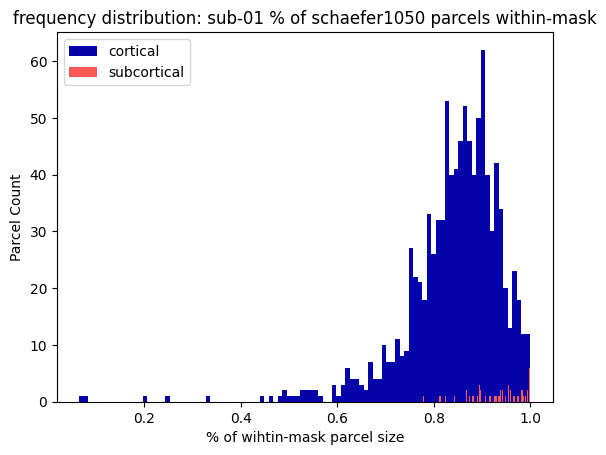

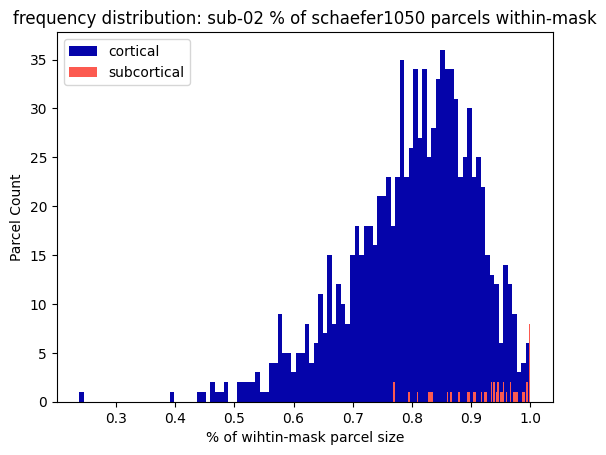

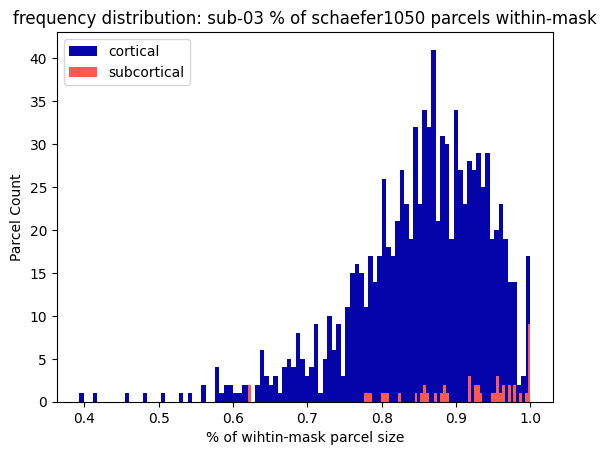

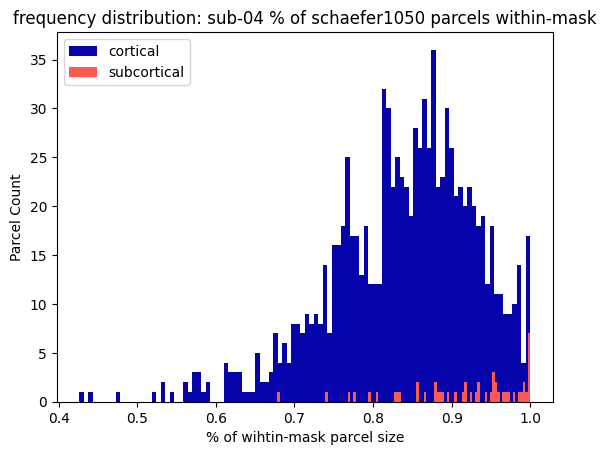

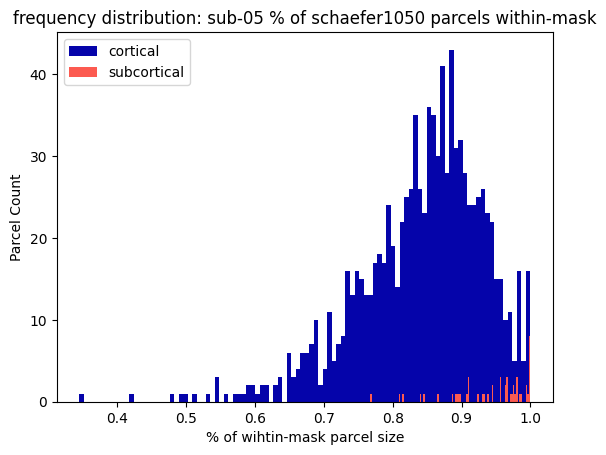

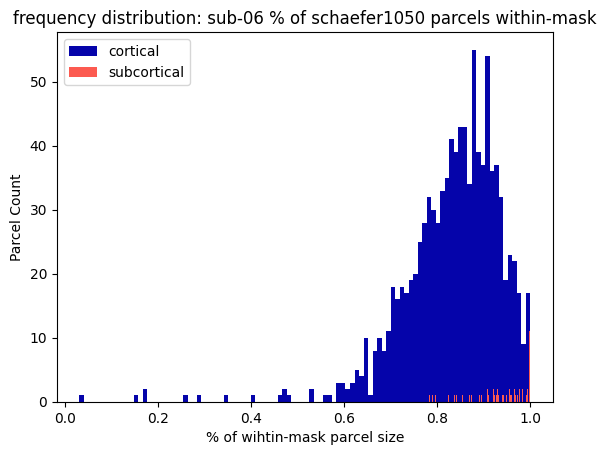

In [37]:
"""
Plot what portion of each parcel (in number of voxels, and as a proportion of parcel size)
falls inside each subject's grey matter mask
"""
s1000_lr = nib.load(
    f"{wdir}/tpl-MNI152NLin2009cAsym_res-02_atlas-Schaefer2018_desc-1000Parcels7Networks_dseg.nii.gz"
) 

s1050 = resample_to_img(scha1050, s1000_lr, interpolation="nearest").get_fdata()

total = []
for v in range(1, 1051):
    t_roi = s1050 == v  # schaefer1050 parcel mask
    total.append(np.sum(t_roi))

# print smallest parcel sizes and their label (index)
sort_total = np.argsort(total)
print("atlas", np.stack((total, range(1, 1051)), axis=1)[sort_total][:10].tolist())

plt.hist(total[:1000], bins=100, color='xkcd:royal blue', label="cortical")
plt.hist(total[1000:], bins=100, color='xkcd:coral', label="subcortical")
plt.title("frequency distribution: parcel size for schaefer1050 parcels")
plt.xlabel('Number of voxels')
plt.ylabel('Parcel Count')
plt.legend()
plt.show()

for s in ["01", "02", "03", "04", "05", "06"]:
    gm_friends = nib.load(
        f"{wdir}/sub-{s}_task-friends_space-MNI152NLin2009cAsym_label-boldGMOverlap_mask.nii.gz"
    )
    s_mask = gm_friends.get_fdata()

    in_mask = []
    for v in range(1, 1051):
        t_roi = s1050 == v  # schaefer1050 parcel mask
        t_size = np.sum(t_roi)
        ol = np.sum(t_roi * s_mask)    # overlap w grey matter mask   
        in_mask.append(ol)   

    # print smallest parcel sizes and their label (index)
    sort_im = np.argsort(in_mask)
    print(f"sub-{s}", np.stack((in_mask, range(1, 1051)), axis=1)[sort_im][:10].tolist())

    plt.hist(in_mask[:1000], bins=100, color='xkcd:royal blue', label="cortical")
    plt.hist(in_mask[1000:], bins=100, color='xkcd:coral', label="subcortical")
    plt.title(f"frequency distribution: sub-{s} within-mask schaefer1050 parcel size")
    plt.xlabel('Number of within-mask voxels')
    plt.ylabel('Parcel Count')
    plt.legend()
    plt.show()
    

for s in ["01", "02", "03", "04", "05", "06"]:
    gm_friends = nib.load(
        f"{wdir}/sub-{s}_task-friends_space-MNI152NLin2009cAsym_label-boldGMOverlap_mask.nii.gz"
    )
    s_mask = gm_friends.get_fdata()

    in_mask_ratio = []
    for v in range(1, 1051):
        t_roi = s1050 == v  # schaefer1050 parcel mask
        t_size = np.sum(t_roi)
        ol = np.sum(t_roi * s_mask)    # overlap w grey matter mask
        in_mask_ratio.append(ol/t_size)

    plt.hist(in_mask_ratio[:1000], bins=100, color='xkcd:royal blue', label="cortical")
    plt.hist(in_mask_ratio[1000:], bins=100, color='xkcd:coral', label="subcortical")
    plt.title(f"frequency distribution: sub-{s} % of schaefer1050 parcels within-mask")
    plt.xlabel('% of wihtin-mask parcel size')
    plt.ylabel('Parcel Count')
    plt.legend()
    plt.show()


## QC notes: small parcels to consider discarding

### Consider excuding schaefer parcels that have too few voxels inside subjects' the grey matter mask

Cutoff: < 10 voxels? 


idx (vox count) \
366 (1), 471 (3), 476 (3), 985 (4),  985(4), 680 (7), 903 (8)   sub-06 

903 (6) # sub-05 

903 (8) # sub-04 

903 (9) # sub-03 

903 (8) # sub-02 

680 (6), 903 (7) # sub-01 


# 3. Importing Nettekoven cerebellar parcels into Shaeffer1050 (Schaefer1000 + Tian S3)

Nettekoven128 has (up to, some are size 0) 128 cerebellar parcels. We wish to add them from the Nettekoven altlas warped to MNI152NLin2009cAsym template to Schaefer1050



## 3.1 Sanity checks

### overlap between parcels from the two atlases, fit inside the subjects' grey matter masks, final parcel size, discard parcels that are too small, etc

(193, 229, 193) (193, 229, 193) (193, 229, 193) (97, 115, 97)


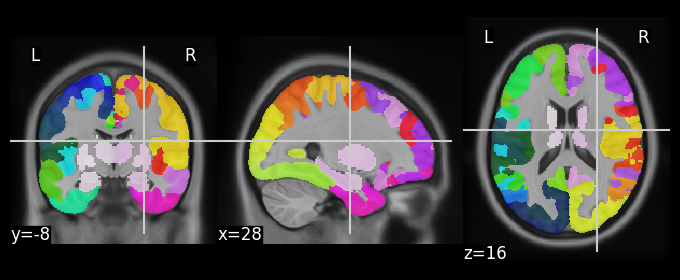

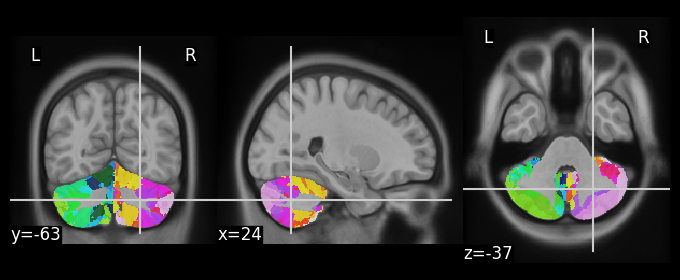

In [40]:
# Load and visualuze Schaefer1050 atlas and transformed Nettekoven128 atlas

mni_09casym = nib.load(
    f'{wdir}/tpl-MNI152NLin2009cAsym_res-01_T1w.nii.gz'
)
mni_09casym_res2 = nib.load(
    f'{wdir}/tpl-MNI152NLin2009cAsym_res-02_T1w.nii.gz'
)

scha1050 = nib.load(
    f"{wdir}/tpl-MNI152NLin2009cAsym_res-01_atlas-Schaefer2018plus_desc-1050Parcels7NetworksTianS3_dseg.nii.gz"
)
plot_roi(scha1050, mni_09casym)

nette128 = nib.load(
    f'{wdir}/tpl-MNI152NLin2009cAsym_res-01_atlas-NettekovenAsym128_desc-GL_dseg.nii.gz'
)
plot_roi(nette128, mni_09casym)

print(mni_09casym.shape, scha1050.shape, nette128.shape, mni_09casym_res2.shape)

In [44]:
# assess nettekoven label distribution; 
# Result: 114 parcels (not 128...)
# the res-02 atlas has 109 parcels (even lower...)

print("High-res number of parcels:", len(np.unique(nette128.get_fdata()))-1)  
print("parcel labels", np.unique(nette128.get_fdata()))
print()


High-res number of parcels: 114
parcel labels [  0.   1.   2.   3.   4.   5.   6.   7.   8.   9.  10.  11.  12.  13.
  14.  15.  16.  17.  20.  21.  22.  23.  24.  25.  26.  27.  28.  29.
  30.  31.  32.  33.  34.  35.  36.  37.  38.  39.  40.  41.  42.  44.
  45.  46.  47.  48.  49.  50.  51.  52.  53.  54.  55.  56.  57.  58.
  60.  61.  62.  64.  65.  66.  67.  68.  69.  71.  72.  73.  74.  75.
  76.  77.  78.  79.  80.  81.  84.  85.  86.  87.  88.  89.  92.  93.
  94.  96.  97.  98.  99. 100. 101. 102. 103. 104. 105. 106. 108. 109.
 110. 111. 112. 113. 114. 115. 116. 117. 118. 119. 120. 121. 122. 123.
 124. 125. 126.]



In [45]:
"""
Check if there is any overlap between Nettekoven's cerebellar parcels and schaefer1050 parcellation

verdict: the largest majority of ceberellar parcels have no overlap with schaefer1050. 
From the 6-9 (out of >100) parcels) with some overlap, the overlap is only a small fraction of the parcel size

Labelling priority will be given to Schaefer, so that the existing Schaefer1050 label takes precedence over Nettekoven128
"""

print("High-res atlas")
s_vox_1 = scha1050.get_fdata() > 0.0
n128_1 = nette128.get_fdata()

overlap_s1 = []
ratio_s1 = []
idx_list1 = []

for v in range(1, 127):
    n_roi = n128_1 == v  # tian parcel mask
    n_size = np.sum(n_roi)

    if n_size > 0:
        ol = np.sum(n_roi * s_vox_1)    # overlap w schaefer1050 cortex

        if ol > 0:
            print(v)  # parcel id
            print(n_size, ol, np.sum(np.logical_and(n_roi == 1, s_vox_1 == 0)))  # parcel size, overlap w schaefer1050, voxels unique to parcel
            print()

        idx_list1.append(v)
        overlap_s1.append(ol)   
        ratio_s1.append(ol/n_size)

print(overlap_s1)
print()


High-res atlas
20
4521 5 4516

36
5413 4 5409

44
3510 23 3487

48
2037 1 2036

68
4865 89 4776

72
6311 104 6207

80
233 6 227

84
2373 18 2355

100
7276 48 7228

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 23, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 89, 0, 0, 104, 0, 0, 0, 0, 0, 0, 0, 6, 0, 18, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 48, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]



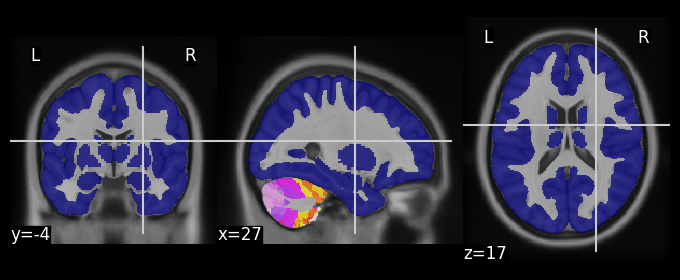

In [47]:
"""
Combine parcels from the two atlases (schaefer1050 and nettekoven128) 

This is NOT the final atlas file; some small parcels will be excluded in the final atlas)

Attribute voxels to the Nettekoven cerebellar parcel if they  :
- belong to that parcel in Nettekoven128
- are not yet assigned to a schaefer1050 parcel (idx = 0)
Reindex the subcortical parcel number to 1050 + Nettekoven128 index
"""

"""
High res atlas
"""
s1050 = scha1050.get_fdata()
n128 = nette128.get_fdata()

for v in range(1, 127):
    s1050[np.logical_and(
        s1050 == 0.0,
        n128 == v,
    )] = v + 1050.0

# Create a nifti file from the array of indices
scha1178 = nib.nifti1.Nifti1Image(
    s1050.astype('float64'),
    affine=scha1050.affine,
)
plot_roi(scha1178, mni_09casym, vmin=1050)


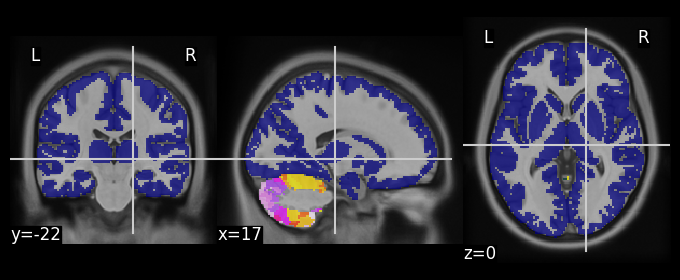

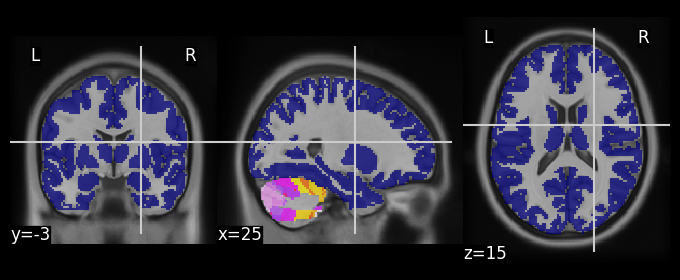

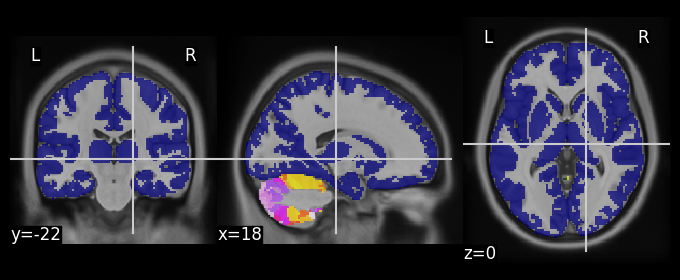

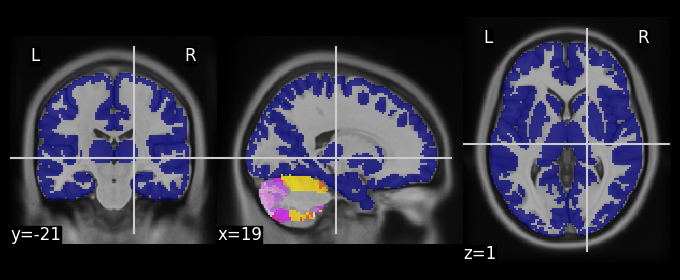

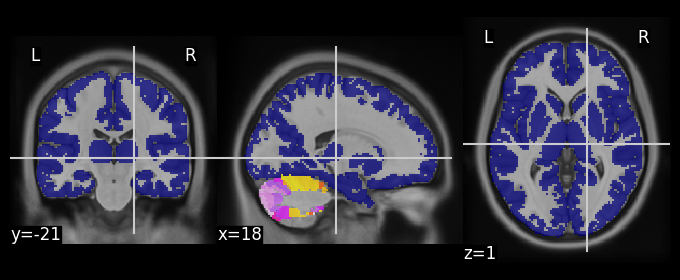

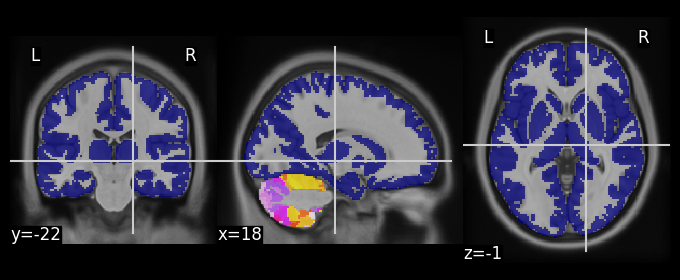

In [48]:
# Visualize temporary atlas masked with each subject's grey matter mask

scha1178_res2 = resample_to_img(scha1178, mni_09casym_res2, interpolation="nearest")

for s in ["01", "02", "03", "04", "05", "06"]:
    gm_friends = nib.load(
        f"{wdir}/sub-{s}_task-friends_space-MNI152NLin2009cAsym_label-boldGMOverlap_mask.nii.gz"
    )
    masked_scha1178_res2 = nib.nifti1.Nifti1Image(
        gm_friends.get_fdata()*scha1178_res2.get_fdata(),
        affine=scha1178_res2.affine,
    )
    plot_roi(masked_scha1178_res2, mni_09casym, vmin=1050)

atlas [[1.0, 1149.0], [1.0, 1110.0], [1.0, 1081.0], [1.0, 1065.0], [2.0, 1165.0], [2.0, 1077.0], [3.0, 1144.0], [3.0, 1057.0], [3.0, 1169.0], [4.0, 1129.0], [4.0, 1092.0], [5.0, 1064.0], [6.0, 1143.0], [8.0, 1076.0], [10.0, 1074.0], [11.0, 903.0], [13.0, 245.0], [13.0, 1060.0], [14.0, 1136.0], [14.0, 466.0], [15.0, 1051.0], [16.0, 1174.0], [16.0, 1128.0], [16.0, 865.0], [17.0, 1121.0]]


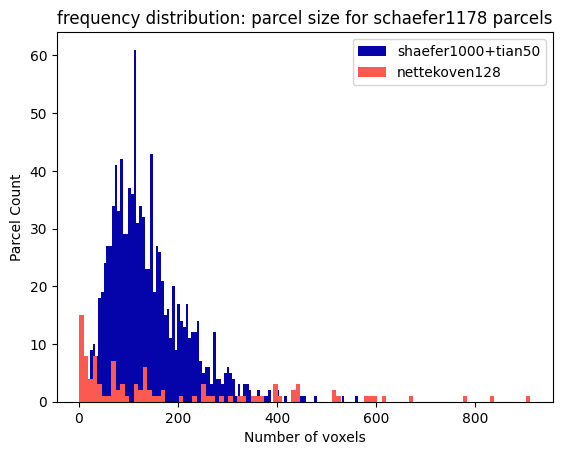

sub-01 [[1.0, 1065.0], [1.0, 1149.0], [1.0, 1110.0], [1.0, 1081.0], [1.0, 1077.0], [2.0, 1165.0], [3.0, 1057.0], [3.0, 1144.0], [3.0, 1169.0], [4.0, 1129.0], [4.0, 1092.0], [5.0, 1064.0], [6.0, 1143.0], [6.0, 680.0], [7.0, 903.0], [8.0, 1074.0], [8.0, 1076.0], [10.0, 822.0], [11.0, 821.0], [11.0, 245.0], [12.0, 1136.0], [13.0, 466.0], [13.0, 1060.0], [13.0, 471.0], [13.0, 1121.0], [13.0, 1142.0], [15.0, 1051.0], [15.0, 476.0], [16.0, 1128.0], [16.0, 1174.0]]


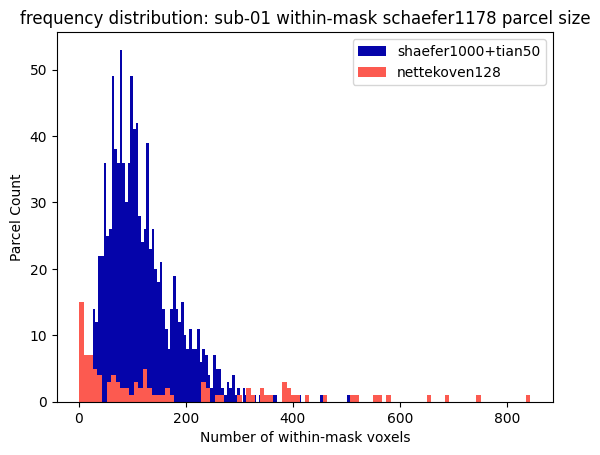

sub-02 [[1.0, 1110.0], [1.0, 1077.0], [1.0, 1081.0], [1.0, 1065.0], [1.0, 1149.0], [2.0, 1165.0], [3.0, 1144.0], [3.0, 1057.0], [3.0, 1169.0], [4.0, 1129.0], [4.0, 1092.0], [5.0, 1064.0], [6.0, 1143.0], [6.0, 1128.0], [7.0, 1139.0], [8.0, 1076.0], [8.0, 903.0], [10.0, 245.0], [10.0, 1074.0], [13.0, 466.0], [13.0, 680.0], [13.0, 1060.0], [14.0, 1136.0], [15.0, 482.0], [15.0, 1051.0], [15.0, 476.0], [16.0, 622.0], [16.0, 865.0], [16.0, 1174.0], [16.0, 471.0]]


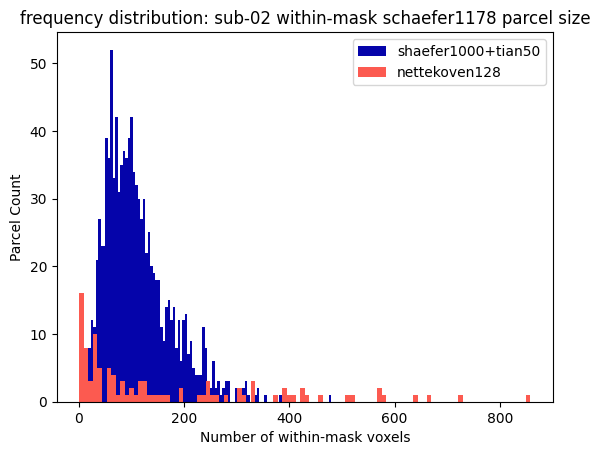

sub-03 [[0.0, 1149.0], [1.0, 1081.0], [1.0, 1110.0], [1.0, 1065.0], [2.0, 1165.0], [2.0, 1077.0], [3.0, 1057.0], [3.0, 1144.0], [3.0, 1169.0], [4.0, 1092.0], [4.0, 1129.0], [5.0, 1064.0], [6.0, 1143.0], [8.0, 1076.0], [9.0, 903.0], [9.0, 1074.0], [12.0, 1142.0], [12.0, 245.0], [13.0, 466.0], [13.0, 680.0], [13.0, 1060.0], [14.0, 1128.0], [14.0, 1136.0], [15.0, 1051.0], [16.0, 471.0], [16.0, 476.0], [16.0, 1174.0], [16.0, 865.0], [17.0, 622.0], [17.0, 1121.0]]


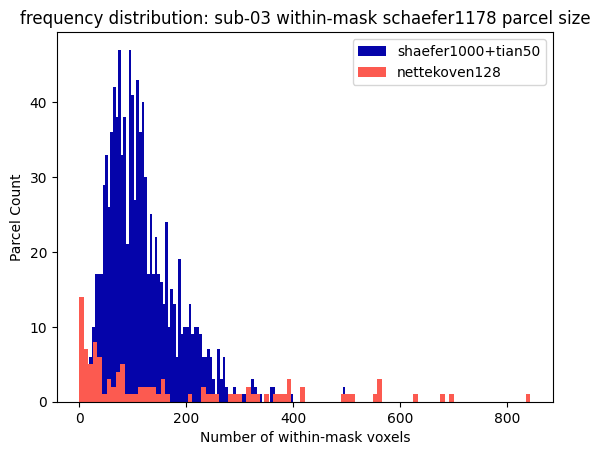

sub-04 [[1.0, 1081.0], [1.0, 1149.0], [1.0, 1110.0], [1.0, 1065.0], [2.0, 1144.0], [2.0, 1077.0], [2.0, 1057.0], [2.0, 1165.0], [3.0, 1129.0], [3.0, 1169.0], [4.0, 1092.0], [4.0, 1076.0], [5.0, 1064.0], [6.0, 1143.0], [6.0, 1074.0], [8.0, 1139.0], [8.0, 903.0], [9.0, 1136.0], [11.0, 1060.0], [11.0, 245.0], [12.0, 466.0], [12.0, 1121.0], [12.0, 1128.0], [13.0, 471.0], [14.0, 680.0], [14.0, 1174.0], [15.0, 1051.0], [15.0, 1142.0], [15.0, 865.0], [16.0, 476.0]]


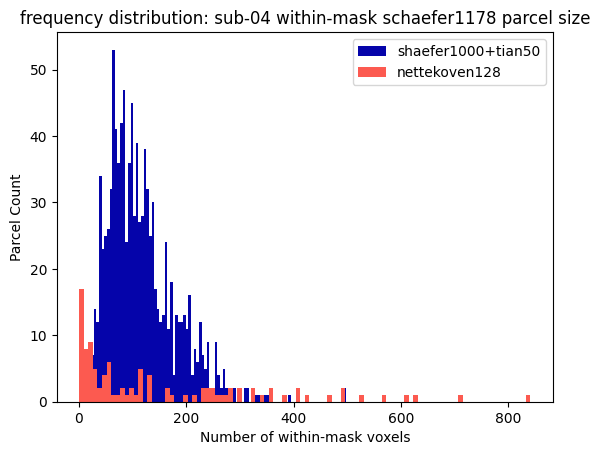

sub-05 [[0.0, 1149.0], [1.0, 1110.0], [1.0, 1081.0], [1.0, 1065.0], [2.0, 1063.0], [2.0, 1077.0], [2.0, 1165.0], [3.0, 1144.0], [3.0, 1128.0], [3.0, 1057.0], [3.0, 1169.0], [3.0, 1064.0], [4.0, 1139.0], [4.0, 1129.0], [4.0, 1092.0], [6.0, 903.0], [6.0, 1143.0], [7.0, 1127.0], [8.0, 1076.0], [10.0, 1074.0], [11.0, 1142.0], [13.0, 1108.0], [13.0, 1060.0], [13.0, 245.0], [14.0, 1136.0], [14.0, 466.0], [15.0, 1051.0], [15.0, 476.0], [15.0, 471.0], [16.0, 1174.0]]


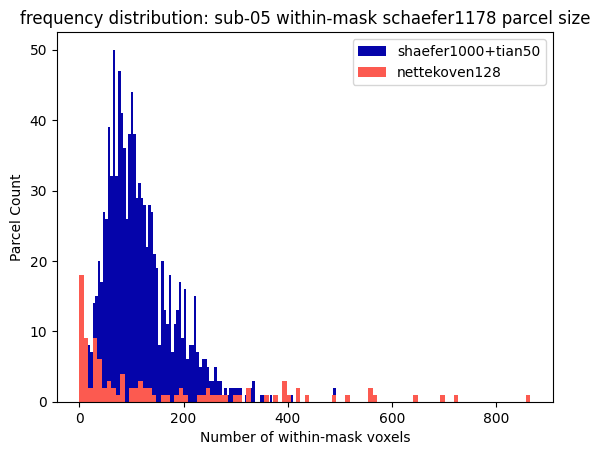

sub-06 [[1.0, 366.0], [1.0, 1110.0], [1.0, 1065.0], [1.0, 1149.0], [1.0, 1081.0], [2.0, 1077.0], [2.0, 1165.0], [2.0, 1129.0], [3.0, 1057.0], [3.0, 1144.0], [3.0, 476.0], [3.0, 1169.0], [3.0, 471.0], [4.0, 985.0], [4.0, 1092.0], [5.0, 1064.0], [6.0, 1143.0], [7.0, 680.0], [8.0, 1076.0], [8.0, 903.0], [9.0, 1074.0], [10.0, 466.0], [11.0, 371.0], [12.0, 245.0], [13.0, 1142.0], [13.0, 1060.0], [13.0, 653.0], [14.0, 1136.0], [15.0, 1051.0], [15.0, 865.0]]


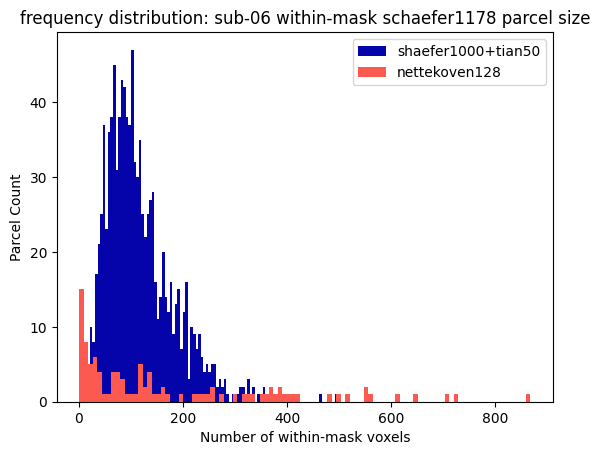

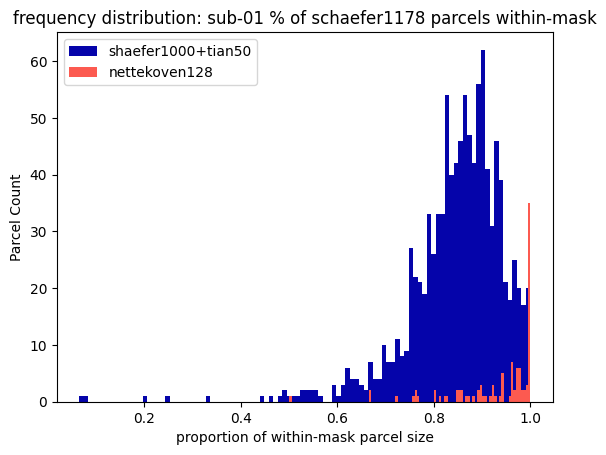

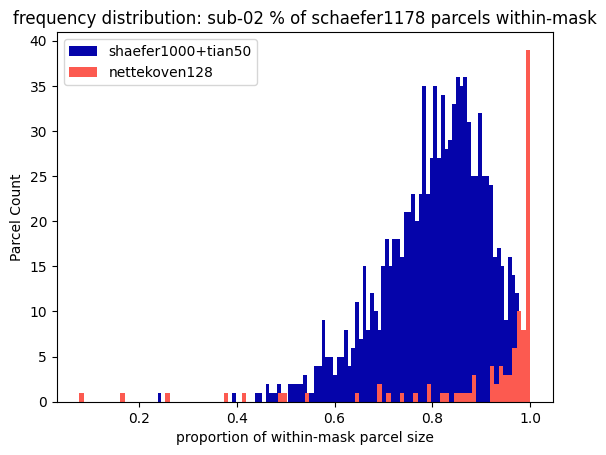

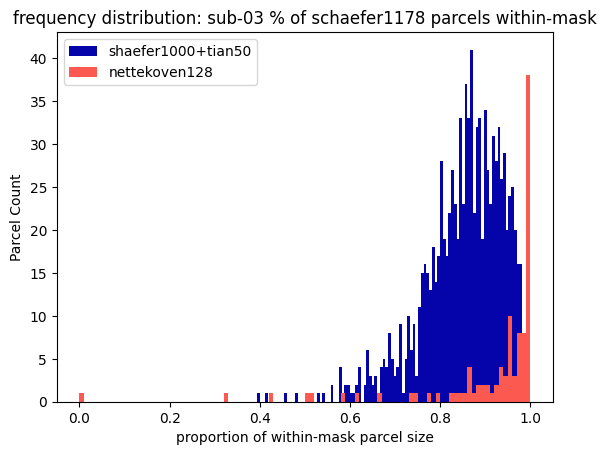

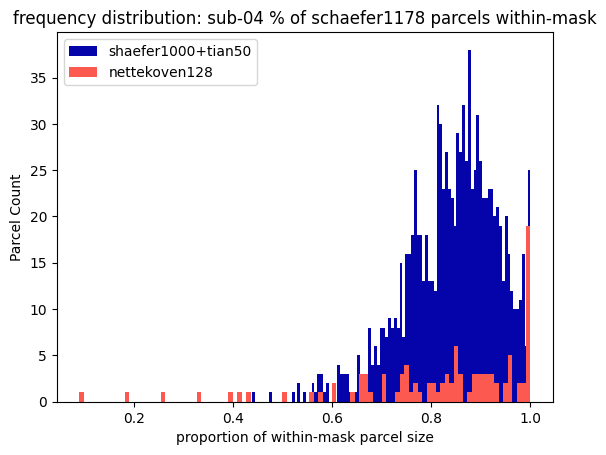

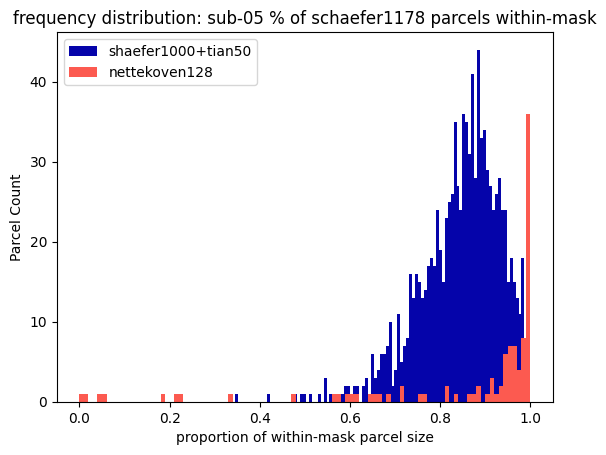

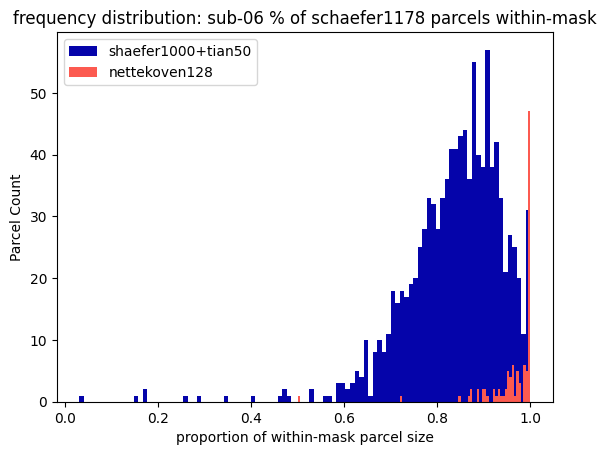

In [50]:
"""
In the joint hybrid atlas file, plot what portion of each nettekoven parcel 
(in number of voxels, and as a proportion of parcel size) falls inside each 
subject's grey matter mask

Compile a list of very snmall / empty parcels that should be dropped from the final atlas
"""

""" 
Set atlas res
"""

parcel_list = []
s1178 = resample_to_img(scha1178, mni_09casym_res2, interpolation="nearest").get_fdata()

total = []
ids = []
for v in np.unique(s1178):
    if v > 0:
        s_roi = s1178 == v  # schaefer1178 parcel mask
        total.append(np.sum(s_roi))
        ids.append(v)

# print smallest parcel sizes and their label (index)
sort_total = np.argsort(total)
print("atlas", np.stack((total, ids), axis=1)[sort_total][:25].tolist())
parcel_list.append(np.stack((total, ids), axis=1))

#plt.hist(total[:1000], bins=100, color='xkcd:royal blue', label="cortical")
#plt.hist(total[1000:1050], bins=100, color='xkcd:coral', label="subcortical")
plt.hist(total[:1050], bins=100, color='xkcd:royal blue', label="shaefer1000+tian50")
plt.hist(total[1050:], bins=100, color='xkcd:coral', label="nettekoven128")
plt.title("frequency distribution: parcel size for schaefer1178 parcels")
plt.xlabel('Number of voxels')
plt.ylabel('Parcel Count')
plt.legend()
plt.show()

for s in ["01", "02", "03", "04", "05", "06"]:
    gm_friends = nib.load(
        f"{wdir}/sub-{s}_task-friends_space-MNI152NLin2009cAsym_label-boldGMOverlap_mask.nii.gz"
    )
    s_mask = gm_friends.get_fdata()

    in_mask = []
    ids_im = []
    for v in np.unique(s1178):
        if v > 0:
            s_roi = s1178 == v  # schaefer1178 parcel mask
            #s_size = np.sum(s_roi)
            ol = np.sum(s_roi * s_mask)    # overlap w grey matter mask    
            in_mask.append(ol) 
            ids_im.append(v)

    # print smallest parcel sizes and their label (index)
    sort_im = np.argsort(in_mask)
    print(f"sub-{s}", np.stack((in_mask, ids_im), axis=1)[sort_im][:30].tolist())
    parcel_list.append(np.stack((in_mask, ids_im), axis=1))
    
    plt.hist(in_mask[:1050], bins=100, color='xkcd:royal blue', label="shaefer1000+tian50")
    plt.hist(in_mask[1050:], bins=100, color='xkcd:coral', label="nettekoven128")
    plt.title(f"frequency distribution: sub-{s} within-mask schaefer1178 parcel size")
    plt.xlabel('Number of within-mask voxels')
    plt.ylabel('Parcel Count')
    plt.legend()
    plt.show()
    
for s in ["01", "02", "03", "04", "05", "06"]:
    gm_friends = nib.load(
        f"{wdir}/sub-{s}_task-friends_space-MNI152NLin2009cAsym_label-boldGMOverlap_mask.nii.gz"
    )
    s_mask = gm_friends.get_fdata()

    in_mask_ratio = []
    for v in np.unique(s1178):
        if v > 0:
            s_roi = s1178 == v  # schaefer1178 parcel mask
            s_size = np.sum(s_roi)
            ol = np.sum(s_roi * s_mask)    # overlap w grey matter mask    
            in_mask_ratio.append(ol/s_size)

    plt.hist(in_mask_ratio[:1050], bins=100, color='xkcd:royal blue', label="shaefer1000+tian50")
    plt.hist(in_mask_ratio[1050:], bins=100, color='xkcd:coral', label="nettekoven128")
    plt.title(f"frequency distribution: sub-{s} % of schaefer1178 parcels within-mask")
    plt.xlabel('proportion of within-mask parcel size')
    plt.ylabel('Parcel Count')
    plt.legend()
    plt.show()

In [75]:
parcel_vals = np.concatenate(parcel_list)
#p_sort = np.argsort(parcel_vals[:, 0])
small_parcels = parcel_vals[parcel_vals[:, 0] < 5.0]#.astype(int)

exclude_tian = (small_parcels[np.logical_and(
    small_parcels[:, 1] > 1000,
    small_parcels[:, 1] < 1051,
)][:, 1] - 1000).tolist()

exclude_schaefer = np.unique(small_parcels[
    small_parcels[:, 1] < 1001
][:, 1]).tolist()

exclude_nettekoven = np.unique(small_parcels[
    small_parcels[:, 1] > 1050
][:, 1] - 1050).tolist()

print("tian", exclude_tian)
print("schafer", exclude_schaefer)
print("nettekoven", exclude_nettekoven)



tian []
schafer [366.0, 471.0, 476.0, 985.0]
nettekoven [7.0, 13.0, 14.0, 15.0, 26.0, 27.0, 31.0, 42.0, 60.0, 78.0, 79.0, 89.0, 94.0, 99.0, 115.0, 119.0]


In [72]:
"""
List of parcels to exclude from atlas, < 10 voxels...
"""

# < 10 vox
#exclude_schaefer_highres = [366., 471., 476., 680., 903., 985.]
#exclude_nettekoven_highres = [  7.,  13.,  14.,  15.,  24.,  26.,  27.,  31.,  42.,  60.,  77., 78.,  79.,  86.,  89.,  93.,  94.,  99., 115., 119.]

# < 5 vox
exclude_schaefer_highres = [366.0, 471.0, 476.0, 985.0]
exclude_nettekoven_highres = [7.0, 13.0, 14.0, 15.0, 26.0, 27.0, 31.0, 42.0, 60.0, 78.0, 79.0, 89.0, 94.0, 99.0, 115.0, 119.0]

# formally exclude parcels left with no voxels left once the high res atlas is resampled to functional resolution with nearest neighbor algo (before masking) 
exclude_nettekoven_highres += [6.0,  16.0,  18.0,  19.0,  35.0,  43.0,  47.0,  51.0,  55.0,  59.0,  63.0,  70.0,  82.0, 83.0,  88.0,  90.0,  91.0,  95.0, 106.0, 107.0, 111.0, 123.0]


/home/mstlaure/Documents/Marie/neuromod/legacy_venv/movie_making/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:145: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  figure = plt.figure(figure, figsize=figsize,
/home/mstlaure/Documents/Marie/neuromod/legacy_venv/movie_making/lib/python3.8/site-packages/nilearn/plotting/find_cuts.py:66: UserWarning: Given img is empty. Returning default cut_coords=(0.0, 0.0, 0.0) instead.
  warnings.warn(
/home/mstlaure/Documents/Marie/neuromod/legacy_venv/movie_making/lib/python3.8/site-packages/nilearn/plotting/displays/_slicers.py:383: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))
/home/mstlaure/Documents/Marie/neuromod/legacy_venv/movie_

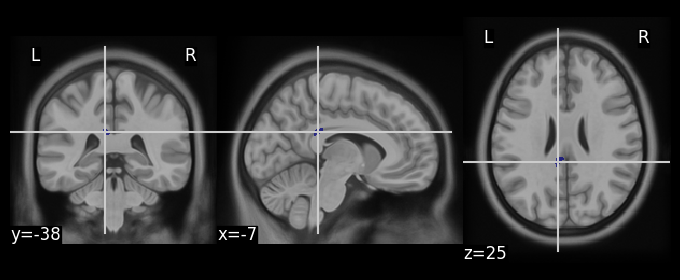

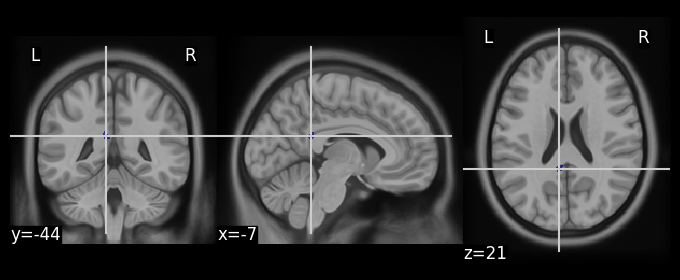

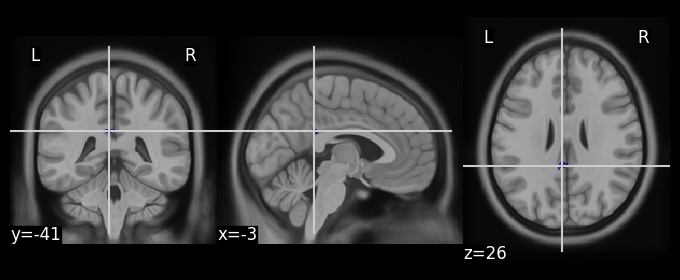

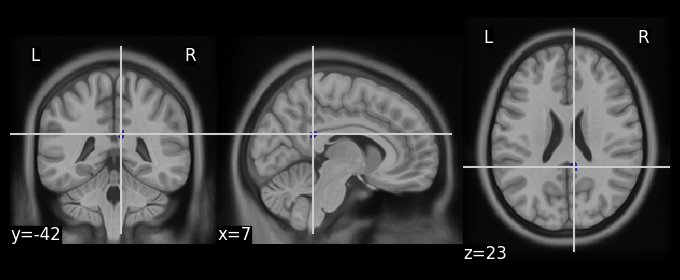

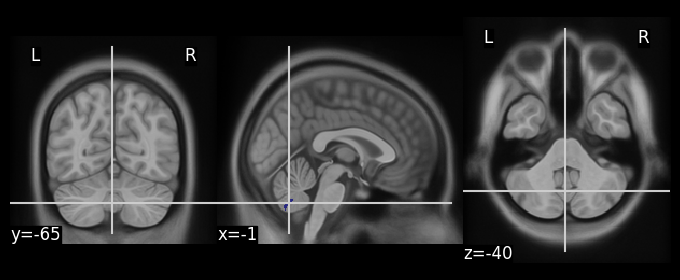

...

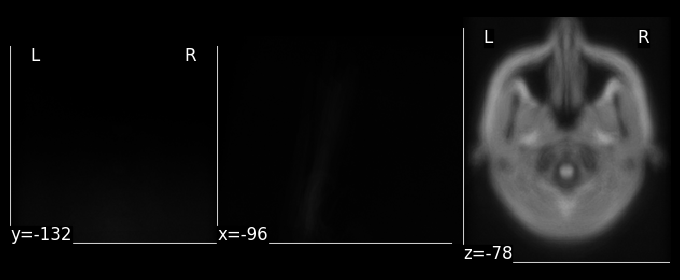

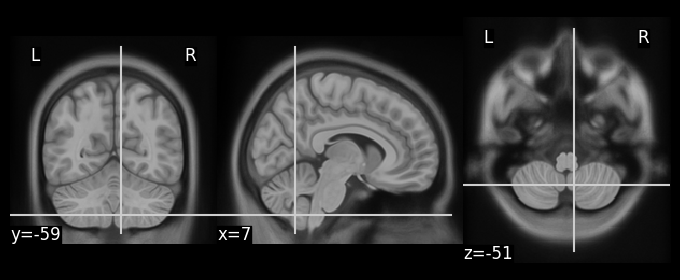

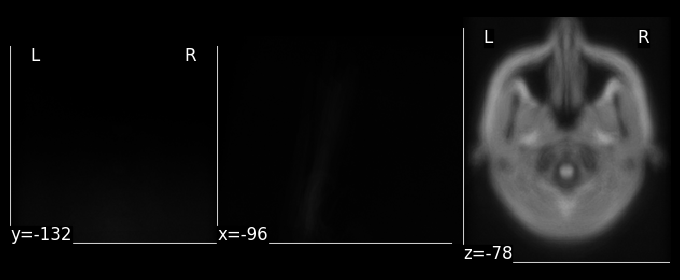

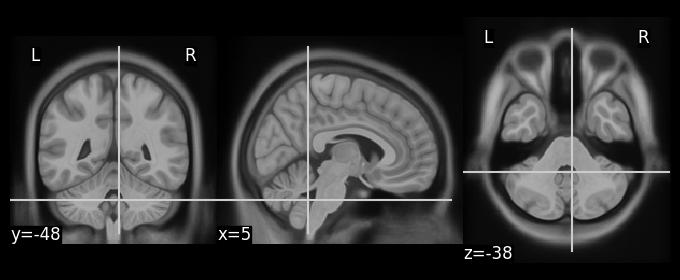

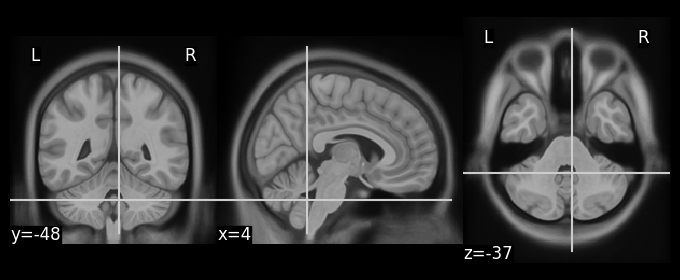

In [74]:
# High res atlas

# Visualize removed schaefer parcels < 5

for v in exclude_schaefer_highres:
    parcel_mask = nib.nifti1.Nifti1Image(
        (scha1178.get_fdata() == v).astype(int),
        affine=scha1178.affine,
    )
    plot_roi(parcel_mask, mni_09casym)

# Visualize removed nettekoven parcels < 5

for v in exclude_nettekoven_highres:
    parcel_mask = nib.nifti1.Nifti1Image(
        (scha1178.get_fdata() == v + 1050).astype(int),
        affine=scha1178.affine,
    )
    plot_roi(parcel_mask, mni_09casym)


## List of parcels that are too small

Atlas: label (num voxels)

### Total
#### highres:
- Nettekoven: 99 (1), 60 (1), 31 (1), 15 (1), 115 (2), 27 (2), 94 (3), 7 (3), 119 (3), 79 (4), 42 (4), 14 (5), 93 (6), 26 (8)
#### lowres:
- Nettekoven: 51.0 (1.0), 106.0 (1.0), 111.0 (1.0), 88.0 (1.0), 123.0 (1.0), 115.0 (1.0), 14.0 (2.0), 15.0 (2.0), 119.0 (2.0), 16.0 (2.0), 55.0 (2.0), 60.0 (2.0), 94.0 (3.0), 79.0 (4.0), 31.0 (5.0), 42.0 (6.0), 26.0 (7.0), 24.0 (8.0)
- Schaefer1000: 903.0 (9.0)
  
### Sub-01
#### highres:
- Nettekoven: 15.0 (1.0), 99.0 (1.0), 60.0 (1.0), 31.0 (1.0), 27.0 (1.0), 115.0 (2.0), 7.0 (3.0), 94.0 (3.0), 119.0 (3.0), 79.0 (4.0), 42.0 (4.0), 14.0 (5.0), 93.0 (6.0), 24.0 (8.0), 26.0 (8.0)
- Schaefer1000: 680.0 (6.0), 903.0 (7.0)
#### lowres:
- Nettekoven: 60.0 (1.0), 106.0 (1.0), 88.0 (1.0), 111.0 (1.0), 123.0 (1.0), 51.0 (1.0), 115.0 (1.0), 94.0 (2.0), 55.0 (2.0), 119.0 (2.0), 14.0 (2.0), 15.0 (2.0), 16.0 (2.0), 79.0 (4.0), 31.0 (5.0), 24.0 (5.0), 42.0 (6.0), 26.0 (7.0), 71.0 (9.0)
- Schaefer1000: 680.0 (4.0), 245.0 (8.0), 903.0 (9.0), 822.0 (9.0)
  
### Sub-02
#### highres:
- Nettekoven: 60.0 (1.0), 27.0 (1.0), 31.0 (1.0), 15.0 (1.0), 99.0 (1.0), 115.0 (2.0), 94.0 (3.0), 7.0 (3.0), 119.0 (3.0), 79.0 (4.0), 42.0 (4.0), 14.0 (5.0), 93.0 (6.0), 78.0 (6.0), 89.0 (7.0), 26.0 (8.0)
- Schaefer1000: 903.0 (8.0)
#### lowres:
- Nettekoven: 51.0 (1.0), 88.0 (1.0), 123.0 (1.0), 106.0 (1.0), 115.0 (1.0), 111.0 (1.0), 15.0 (2.0), 16.0 (2.0), 14.0 (2.0), 55.0 (2.0), 119.0 (2.0), 60.0 (2.0), 94.0 (3.0), 79.0 (4.0), 31.0 (5.0), 78.0 (6.0), 42.0 (6.0), 26.0 (7.0), 24.0 (8.0)
- Schaefer1000: 245.0 (8.0), 903.0 (9.0)

### Sub-03
#### highres:
- Nettekoven: 99.0 (0.0), 31.0 (1.0), 60.0 (1.0), 15.0 (1.0), 115.0 (2.0), 27.0 (2.0), 7.0 (3.0), 94.0 (3.0), 119.0 (3.0), 42.0 (4.0), 79.0 (4.0), 14.0 (5.0), 93.0 (6.0), 26.0 (8.0), 24.0 (9.0)
- Schaefer1000: 903.0 (9.0)
#### lowres:
- Nettekoven: 115.0 (1.0), 60.0 (1.0), 88.0 (1.0), 106.0 (1.0), 123.0 (1.0), 111.0 (1.0), 51.0 (1.0), 14.0 (2.0), 55.0 (2.0), 16.0 (2.0), 15.0 (2.0), 119.0 (2.0), 94.0 (3.0), 79.0 (4.0), 31.0 (5.0), 24.0 (6.0), 42.0 (6.0), 26.0 (7.0)
- Schaefer1000: 903.0 (8.0), 245.0 (9.0)

### Sub-04
#### highres:
- Nettekoven: 31.0 (1.0), 99.0 (1.0), 60.0 (1.0), 15.0 (1.0), 94.0 (2.0), 27.0 (2.0), 7.0 (2.0), 115.0 (2.0), 79.0 (3.0), 119.0 (3.0), 42.0 (4.0), 26.0 (4.0), 14.0 (5.0), 93.0 (6.0), 24.0 (6.0), 89.0 (8.0), 86.0 (9.0)
- Schaefer1000: 903.0 (8.0)
#### lowres:
- Nettekoven: 106.0 (1.0), 111.0 (1.0), 51.0 (1.0), 123.0 (1.0), 115.0 (1.0), 16.0 (1.0), 88.0 (1.0), 14.0 (2.0), 15.0 (2.0), 119.0 (2.0), 26.0 (2.0), 94.0 (2.0), 55.0 (2.0), 60.0 (2.0), 24.0 (4.0), 31.0 (4.0), 79.0 (4.0), 42.0 (5.0), 10.0 (7.0), 7.0 (9.0)
- Schaefer1000: 245.0 (8.0), 903.0 (9.0)

### Sub-05
#### highres:
- Nettekoven: 99.0 (0.0), 60.0 (1.0), 31.0 (1.0), 15.0 (1.0), 13.0 (2.0), 27.0 (2.0), 115.0 (2.0), 94.0 (3.0), 78.0 (3.0), 7.0 (3.0), 119.0 (3.0), 14.0 (3.0), 89.0 (4.0), 79.0 (4.0), 42.0 (4.0), 93.0 (6.0), 77.0 (7.0), 26.0 (8.0)
- Schaefer1000: 903.0 (6.0)
#### lowres:
- Nettekoven: 14.0 (0.0), 88.0 (1.0), 16.0 (1.0), 60.0 (1.0), 123.0 (1.0), 106.0 (1.0), 51.0 (1.0), 115.0 (1.0), 111.0 (1.0), 15.0 (2.0), 78.0 (2.0), 119.0 (2.0), 55.0 (2.0), 94.0 (3.0), 89.0 (4.0), 79.0 (4.0), 31.0 (5.0), 42.0 (6.0), 26.0 (7.0), 77.0 (8.0), 24.0 (8.0), 13.0 (8.0)
- Schaefer1000: 903.0 (8.0)

### Sub-06
#### highres:
- Nettekoven: 60.0 (1.0), 15.0 (1.0), 99.0 (1.0), 31.0 (1.0), 27.0 (2.0), 115.0 (2.0), 79.0 (2.0), 7.0 (3.0), 94.0 (3.0), 119.0 (3.0), 42.0 (4.0), 14.0 (5.0), 93.0 (6.0), 26.0 (8.0), 24.0 (9.0)
- Schaefer1000: 366.0 (1.0), 476.0 (3.0), 471.0 (3.0), 985.0 (4.0), 680.0 (7.0), 903.0 (8.0)
#### lowres:
- Nettekoven: 106.0 (1.0), 51.0 (1.0), 115.0 (1.0), 16.0 (1.0), 123.0 (1.0), 111.0 (1.0), 15.0 (1.0), 88.0 (1.0), 55.0 (2.0), 60.0 (2.0), 14.0 (2.0), 119.0 (2.0), 94.0 (3.0), 79.0 (4.0), 31.0 (5.0), 42.0 (6.0), 24.0 (6.0), 26.0 (7.0)
- Schaefer1000: 366.0 (0.0), 476.0 (3.0), 471.0 (4.0), 680.0 (5.0), 985.0 (5.0), 245.0 (9.0), 903.0 (9.0), 371.0 (9.0)


# 4. Generating the final hybrid parcellation atlases



In [76]:
"""
Compile final list of parcels to exclude from atlases, < 10 voxels...

Exclude the same voxels from both the high res and the low res atlas, for consistency
"""


"""
List of parcels to exclude from atlas, < 10 voxels...
"""

# < 10 vox
#exclude_schaefer_highres = [366., 471., 476., 680., 903., 985.]
#exclude_nettekoven_highres = [  7.,  13.,  14.,  15.,  24.,  26.,  27.,  31.,  42.,  60.,  77., 78.,  79.,  86.,  89.,  93.,  94.,  99., 115., 119.]

# < 5 vox
exclude_schaefer_highres = [366.0, 471.0, 476.0, 985.0]
exclude_nettekoven_highres = [7.0, 13.0, 14.0, 15.0, 26.0, 27.0, 31.0, 42.0, 60.0, 78.0, 79.0, 89.0, 94.0, 99.0, 115.0, 119.0]

# formally exclude parcels left with no voxels left once the high res atlas is resampled to functional resolution with nearest neighbor algo (before masking) 
exclude_nettekoven_highres += [6.0,  16.0,  18.0,  19.0,  35.0,  43.0,  47.0,  51.0,  55.0,  59.0,  63.0,  70.0,  82.0, 83.0,  88.0,  90.0,  91.0,  95.0, 106.0, 107.0, 111.0, 123.0]


(193, 229, 193) (193, 229, 193) (193, 229, 193) (193, 229, 193)
451 1001 115


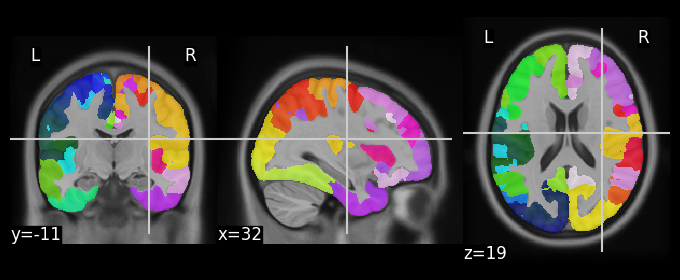

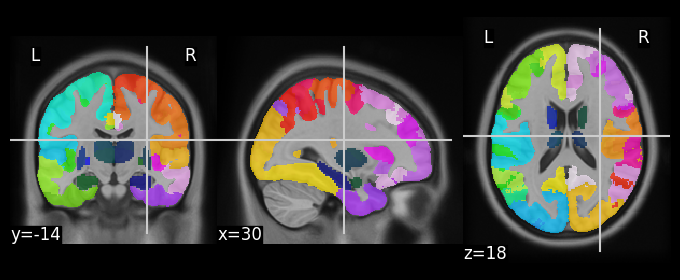

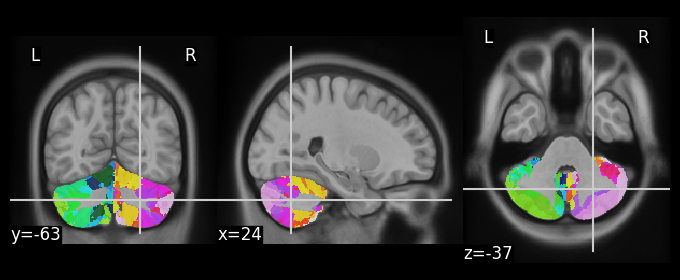

In [78]:
"""
High resolution atlas

Load atlases
"""

wdir = "../../../../masks/schaeffer_subcortex"

mni_09casym = nib.load(f'{wdir}/tpl-MNI152NLin2009cAsym_res-01_T1w.nii.gz')

scha1000 = nib.load(
    f'{wdir}/tpl-MNI152NLin2009cAsym_res-01_atlas-Schaefer2018_desc-1000Parcels7Networks_dseg.nii.gz'
)
plot_roi(scha1000, mni_09casym)

tian400 = nib.load(
    f'{wdir}/Schaefer2018_400Parcels_7Networks_order_Tian_Subcortex_S3_3T_MNI152NLin2009cAsym_1mm.nii.gz'
)
plot_roi(tian400, mni_09casym)

nette128 = nib.load(
    f'{wdir}/tpl-MNI152NLin2009cAsym_res-01_atlas-NettekovenAsym128_desc-GL_dseg.nii.gz'
)
plot_roi(nette128, mni_09casym)

print(tian400.shape, scha1000.shape, nette128.shape, mni_09casym.shape)
print(len(np.unique(tian400.get_fdata())), len(np.unique(scha1000.get_fdata())), len(np.unique(nette128.get_fdata())))

1134

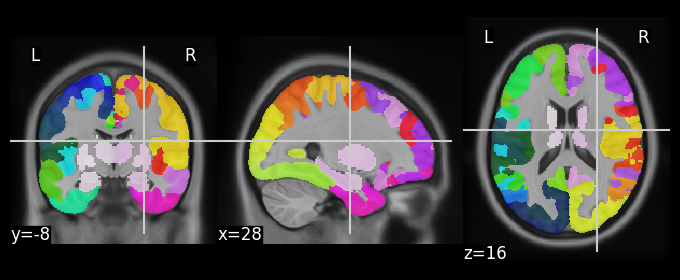

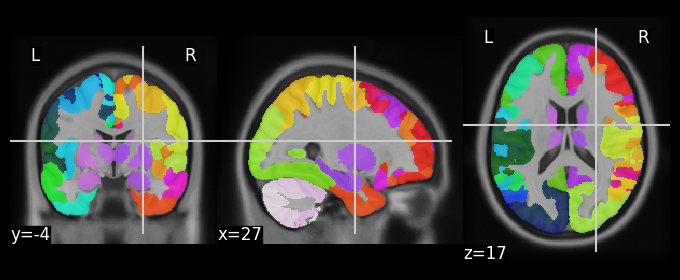

In [85]:
"""
Combine the high-res atlases
"""

s1000 = scha1000.get_fdata()
t400 = tian400.get_fdata()
n128 = nette128.get_fdata()

# blank atlas array
s1178 = np.zeros(s1000.shape)

# Add schaefer1000 parcels to blank array, 
for v in range(1, 1001):
    if float(v) not in exclude_schaefer_highres:  # skip over parcels too small to include
        s1178[s1000 == v] = v

# Add tian s3 subcortical voxel labels to schaefer 1000 only if voxels are unlabelled
# Schaefer1000 label takes precedence over Tian50
for v in range(1, 51):
    s1178[np.logical_and(
        s1178==0.0,
        t400 == v,
    )] = v + 1000.0   # set new subcortical labels to 1001+ 

scha1050 = nib.nifti1.Nifti1Image(
    s1178,
    affine=scha1000.affine,
)
plot_roi(scha1050, mni_09casym)

# Add nettekoven 128 cerebellar voxel labels to schaefer 1050 only if voxels are unlabelled
# Schaefer1050 label takes precedence over Nettekoven
for v in range(1, 127):
    if float(v) not in exclude_nettekoven_highres:  # skip over parcels too small to include
        s1178[np.logical_and(
            s1178==0.0,
            n128 == v,
        )] = v + 1050.0  # set new cerebellar labels to 1051+ 

scha1178 = nib.nifti1.Nifti1Image(
    s1178,
    affine=scha1000.affine,
)
plot_roi(scha1178, mni_09casym)

nib.save(scha1178, f"{wdir}/tpl-MNI152NLin2009cAsym_res-01_atlas-Schaefer2018TianS3NettekovenAsym_desc-1000Parcels7Networks50Subcort128Cereb_dseg.nii.gz")

len(np.unique(scha1178.get_fdata()))-1

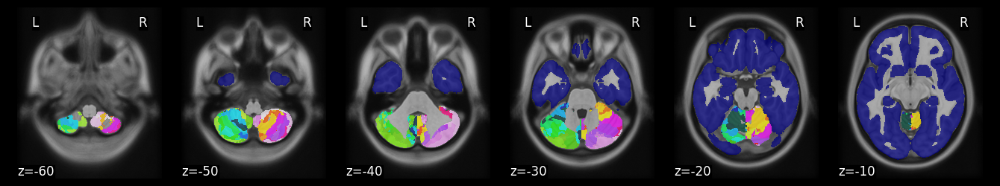

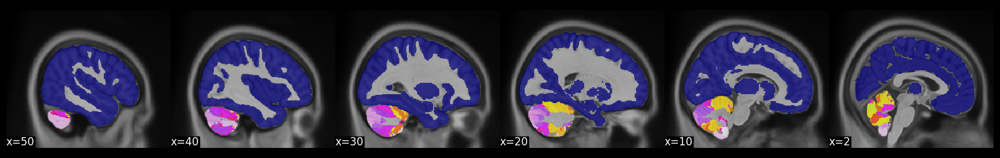

In [80]:
# Visualize cerebellum parcels
plot_roi(scha1178, mni_09casym, vmin=1050, display_mode="z", cut_coords=(-60, -50, -40, -30, -20, -10))
plot_roi(scha1178, mni_09casym, vmin=1050, display_mode="x", cut_coords=(50, 40, 30, 20, 10, 2))


01 1134


/home/mstlaure/Documents/Marie/neuromod/legacy_venv/movie_making/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,


02 1134
03 1134
04 1134


/home/mstlaure/Documents/Marie/neuromod/legacy_venv/movie_making/lib/python3.8/site-packages/numpy/ma/core.py:2820: UserWarning: Warning: converting a masked element to nan.
  _data = np.array(data, dtype=dtype, copy=copy,


05 1134
06 1134


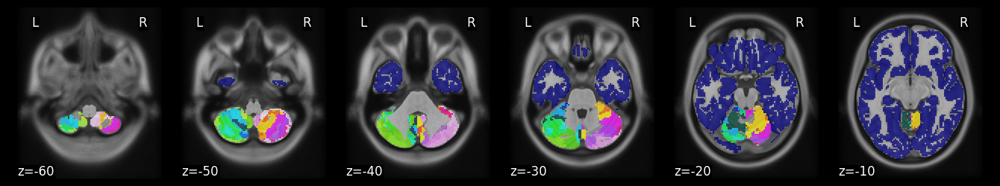

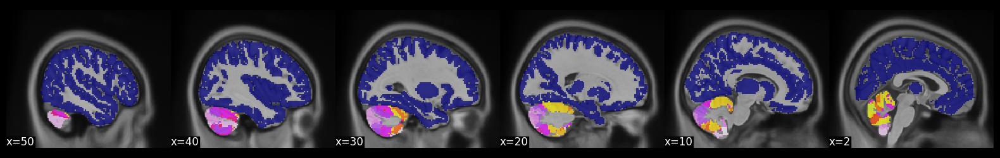

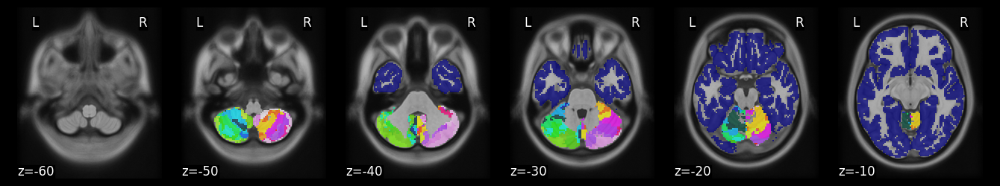

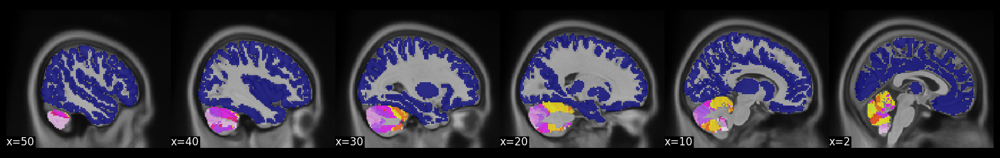

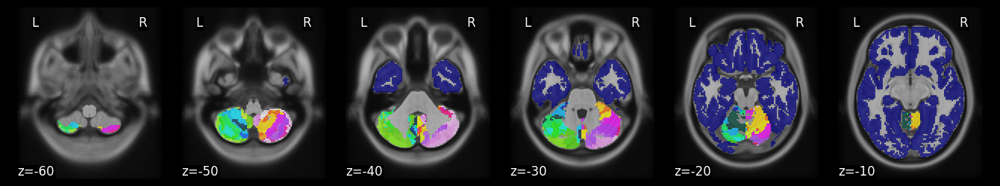

...

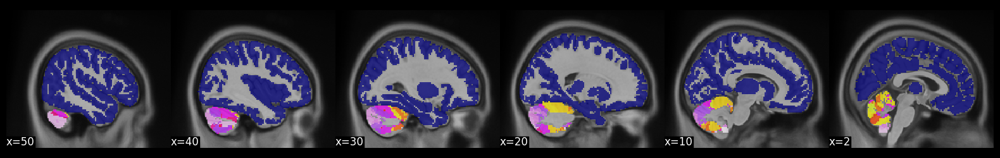

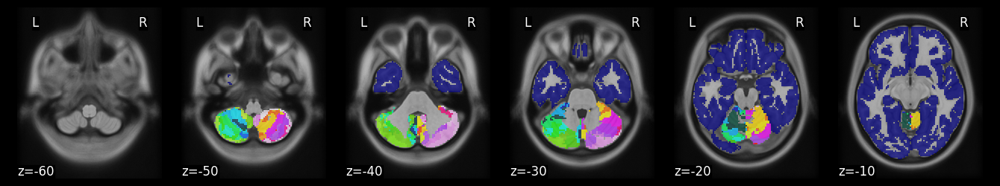

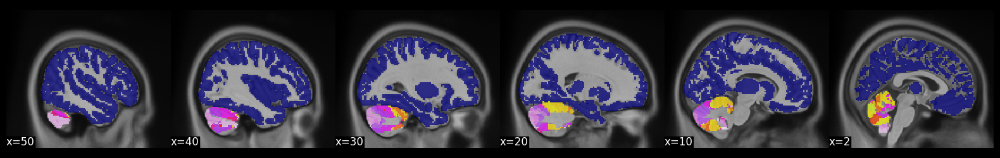

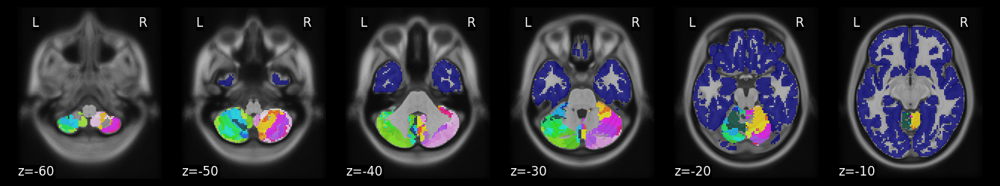

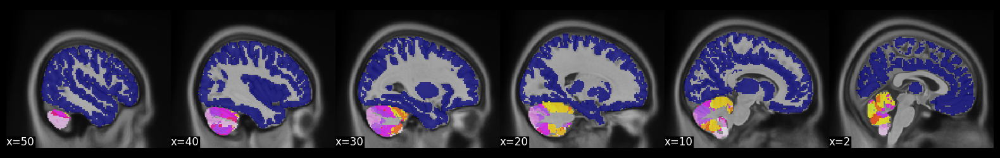

In [86]:
# Visualize final high-res atlas masked with each subject's grey matter mask

for s in ["01", "02", "03", "04", "05", "06"]:
    gm_friends = nib.load(
        f"{wdir}/sub-{s}_task-friends_space-MNI152NLin2009cAsym_label-boldGMOverlap_mask.nii.gz"
    ) 
    masked_scha1178 = nib.nifti1.Nifti1Image(
        gm_friends.get_fdata()*resample_to_img(scha1178, gm_friends, interpolation="nearest").get_fdata(),
        affine=gm_friends.affine,
    )
    plot_roi(masked_scha1178, mni_09casym, vmin=1050, display_mode="z", cut_coords=(-60, -50, -40, -30, -20, -10))
    plot_roi(masked_scha1178, mni_09casym, vmin=1050, display_mode="x", cut_coords=(50, 40, 30, 20, 10, 2))
    print(s, len(np.unique(masked_scha1178.get_fdata()))-1)

# 5. Generating the atlas label documentation

In [88]:
# Load Schaefer1000 parcel labels

s1000_labels = pd.read_csv(f'{wdir}/tpl-MNI152NLin2009cAsym_atlas-Schaefer2018_desc-1000Parcels7Networks_dseg.tsv', sep = '\t')
s1000_labels = s1000_labels[['index', 'name']]
s1000_labels


,index,name
0,1,7Networks_LH_Vis_1
1,2,7Networks_LH_Vis_2
2,3,7Networks_LH_Vis_3
3,4,7Networks_LH_Vis_4
4,5,7Networks_LH_Vis_5
...,...,...
995,996,7Networks_RH_Default_PCC_16
996,997,7Networks_RH_Default_PCC_17
997,998,7Networks_RH_Default_PCC_18
998,999,7Networks_RH_Cont_PCC_1


In [90]:
# Compile a list of Tian400 subcortical parcel labels (parse text file)

filepath = f'{wdir}/Schaefer2018_400Parcels_7Networks_order_Tian_Subcortex_S3_label.txt'

roi_name = ''
idx = -1
idx_list = []
name_list = []
with open(filepath, 'r', encoding='utf-8') as file:
    for line_number, line in enumerate(file, 1):
        # Remove leading/trailing whitespace and newline characters
        processed_line = line.strip()
        if '-' in processed_line:
            roi_name = processed_line
        elif 'Network' in processed_line:
            pass
        else:
            idx = int(processed_line.split(' ')[0])
            if idx < 51:  # Tian400 subcortical parcels labelled 1 to 50 (inclusively)
                print(roi_name, idx)
                idx_list.append(idx + 1000)  # Adjust label number to add to schaefer1000a
                name_list.append(roi_name)

#idx_list, name_list        

subcor_labels = pd.DataFrame({
    'index': idx_list,
    'name': name_list,
})

print(subcor_labels)

HIP-head-m-rh 1
HIP-head-l-rh 2
HIP-body-rh 3
HIP-tail-rh 4
THA-VPm-rh 5
THA-VPl-rh 6
THA-VAi-rh 7
THA-VAs-rh 8
THA-DAm-rh 9
THA-DAl-rh 10
PUT-VA-rh 11
PUT-DA-rh 12
PUT-VP-rh 13
PUT-DP-rh 14
CAU-VA-rh 15
CAU-DA-rh 16
CAU-body-rh 17
CAU-tail-rh 18
lAMY-rh 19
mAMY-rh 20
THA-DP-rh 21
NAc-shell-rh 22
NAc-core-rh 23
pGP-rh 24
aGP-rh 25
HIP-head-m-lh 26
HIP-head-l-lh 27
HIP-body-lh 28
HIP-tail-lh 29
THA-VPm-lh 30
THA-VPl-lh 31
THA-VAi-lh 32
THA-VAs-lh 33
THA-DAm-lh 34
THA-DAl-lh 35
PUT-VA-lh 36
PUT-DA-lh 37
PUT-VP-lh 38
PUT-DP-lh 39
CAU-VA-lh 40
CAU-DA-lh 41
CAU-body-lh 42
CAU-tail-lh 43
lAMY-lh 44
mAMY-lh 45
THA-DP-lh 46
NAc-shell-lh 47
NAc-core-lh 48
pGP-lh 49
aGP-lh 50
    index           name
0    1001  HIP-head-m-rh
1    1002  HIP-head-l-rh
2    1003    HIP-body-rh
3    1004    HIP-tail-rh
4    1005     THA-VPm-rh
5    1006     THA-VPl-rh
6    1007     THA-VAi-rh
7    1008     THA-VAs-rh
8    1009     THA-DAm-rh
9    1010     THA-DAl-rh
10   1011      PUT-VA-rh
11   1012      PUT-DA-rh


In [91]:
# Combine Schaefer1000 and updated Tian subcortical parcels into one dataframe

s1050_labels = pd.concat([s1000_labels, subcor_labels], ignore_index=True)
s1050_labels


,index,name
0,1,7Networks_LH_Vis_1
1,2,7Networks_LH_Vis_2
2,3,7Networks_LH_Vis_3
3,4,7Networks_LH_Vis_4
4,5,7Networks_LH_Vis_5
...,...,...
1045,1046,THA-DP-lh
1046,1047,NAc-shell-lh
1047,1048,NAc-core-lh
1048,1049,pGP-lh


In [92]:
# Compile a list of Nettekoven128 cerebellar parcel labels (parse text file)

filepath = f'{wdir}/atl-NettekovenAsym128.lut'

roi_name = ''
idx = -1
idx_list = []
name_list = []
with open(filepath, 'r', encoding='utf-8') as file:
    for line_number, line in enumerate(file, 1):
        # Remove leading/trailing whitespace and newline characters
        chunks = line.strip().split(' ')
        if int(chunks[0]) > 0:
            print(chunks[-1], int(chunks[0]))
            name_list.append(f'Cereb-{chunks[-1]}')
            idx_list.append(int(chunks[0]) + 1050)  # Adjust parcel number to merge with schaefer1000 and tian50

#idx_list, name_list
cereb_labels = pd.DataFrame({
    'index': idx_list,
    'name': name_list,
})

print(cereb_labels)

M1Ls 1
M1Li 2
M1Lt 3
M1Lv 4
M2Ls 5
M2Li 6
M2Lt 7
M2Lv 8
M3Ls 9
M3Li 10
M3Lt 11
M3Lv 12
M4Ls 13
M4Li 14
M4Lt 15
M4Lv 16
A1Ls 17
A1Li 18
A1Lt 19
A1Lv 20
A2Ls 21
A2Li 22
A2Lt 23
A2Lv 24
A3Ls 25
A3Li 26
A3Lt 27
A3Lv 28
D1Ls 29
D1Li 30
D1Lt 31
D1Lv 32
D2Ls 33
D2Li 34
D2Lt 35
D2Lv 36
D3Ls 37
D3Li 38
D3Lt 39
D3Lv 40
D4Ls 41
D4Li 42
D4Lt 43
D4Lv 44
S1Ls 45
S1Li 46
S1Lt 47
S1Lv 48
S2Ls 49
S2Li 50
S2Lt 51
S2Lv 52
S3Ls 53
S3Li 54
S3Lt 55
S3Lv 56
S4Ls 57
S4Li 58
S4Lt 59
S4Lv 60
S5Ls 61
S5Li 62
S5Lt 63
S5Lv 64
M1Rs 65
M1Ri 66
M1Rt 67
M1Rv 68
M2Rs 69
M2Ri 70
M2Rt 71
M2Rv 72
M3Rs 73
M3Ri 74
M3Rt 75
M3Rv 76
M4Rs 77
M4Ri 78
M4Rt 79
M4Rv 80
A1Rs 81
A1Ri 82
A1Rt 83
A1Rv 84
A2Rs 85
A2Ri 86
A2Rt 87
A2Rv 88
A3Rs 89
A3Ri 90
A3Rt 91
A3Rv 92
D1Rs 93
D1Ri 94
D1Rt 95
D1Rv 96
D2Rs 97
D2Ri 98
D2Rt 99
D2Rv 100
D3Rs 101
D3Ri 102
D3Rt 103
D3Rv 104
D4Rs 105
D4Ri 106
D4Rt 107
D4Rv 108
S1Rs 109
S1Ri 110
S1Rt 111
S1Rv 112
S2Rs 113
S2Ri 114
S2Rt 115
S2Rv 116
S3Rs 117
S3Ri 118
S3Rt 119
S3Rv 120
S4Rs 121
S4Ri 122
S4Rt 123
S

In [93]:
# Combine Schaefer1050 and updated Nettekoven cerebellar parcels into one dataframe

s1178_labels = pd.concat([s1050_labels, cereb_labels], ignore_index=True)
s1178_labels.to_csv(
    #f"{wdir}/tpl-MNI152NLin2009cAsym_atlas-Schaefer2018plus_desc-1178Parcels7NetworksTianS3NettekovenAsym128.tsv",
    f"{wdir}/tpl-MNI152NLin2009cAsym_atlas-Schaefer2018TianS3NettekovenAsym_desc-1000Parcels7Networks50Subcort128Cereb.tsv",
    sep='\t',
    header=True, index=False,
)

s1178_labels


,index,name
0,1,7Networks_LH_Vis_1
1,2,7Networks_LH_Vis_2
2,3,7Networks_LH_Vis_3
3,4,7Networks_LH_Vis_4
4,5,7Networks_LH_Vis_5
...,...,...
1173,1174,Cereb-S4Rv
1174,1175,Cereb-S5Rs
1175,1176,Cereb-S5Ri
1176,1177,Cereb-S5Rt
